# Raw

In [394]:
import requests
import re
import html
import json
from bs4 import BeautifulSoup
import pandas as pd

In [8]:
def getPostInfosFromContent(content):
    jsonDataArray = re.findall(r'\{\"result\"\:\{\"data.*?,\"variables', content)
    #ex. {"result": [get this result], "variables": [ignored]}
    posts = {}
    for jsonData in jsonDataArray:
        jsonData = jsonData[10: -31]
        try:
            data = json.loads(jsonData)['data']['feedback']
            commentsInfo = data['display_comments']['edges']
            comments = []
            for comment in commentsInfo:
                comment = comment['node']
                if comment['body'] is not None:
                    comments.append({
                        'id': comment['id'],
                        'time': comment['created_time'],
#                         'author': comment['author'], # deep information of user
                        'message': comment['body']['text'],
                        'like': comment['feedback']['reactors']['count']
                    })
            actorId = data['owning_profile']['id']
            postId = data['share_fbid']
            posts['{}_{}'.format(actorId, postId)] = {
                'like': data['reaction_count']['count'],
                'share': data['share_count']['count'],
                'comment': data['display_comments_count']['count'],
                'commentsHighlight': comments
            }
        except:
            continue
    return posts

In [9]:
def getPostsFromContent(content, postInfos):
    soup = BeautifulSoup(content, 'html.parser')
    divs = soup.find_all('div', {'class': '_5pcr userContentWrapper'})
    posts = []
    for div in divs:
        try:
            posts_id = div.find_all('div', {'class': '_5pcp _5lel _2jyu _232_'})
            posts_time = div.find_all('span', {'class': 'fsm fwn fcg'})
            posts_link = div.find_all('a', {'class': '_5pcq'})
            posts_text = div.find_all('div', {'class': '_5pbx userContent _3576'})
            postIds = [re.search(r'_[0-9]+;[0-9]+;', div['id']).group()[1:-1].replace(';', '_') for div in posts_id]
            postTimes = [int(span.abbr['data-utime']) for span in posts_time]
            postLinks = ['https://www.facebook.com' + a['href'] for a in posts_link]
            postMessages = []
            for div in posts_text:
                for span in div.find_all('span', {'class': 'text_exposed_hide'}):
                    span.decompose()
                for span in div.find_all('span', {'class': 'see_more_link_inner'}):
                    span.decompose()
                postMessages.append(div.get_text())
            posts.append({
                'id': postIds[0],
                'time': postTimes[0],
                'link': postLinks[0],
                'message': postMessages[0],
                'like': postInfos[postIds[0]]['like'],
                'share': postInfos[postIds[0]]['share'],
                'comment': postInfos[postIds[0]]['comment'],
                'commentsHighlight': postInfos[postIds[0]]['commentsHighlight']
            })
        except:
#             print('Exception')
            continue
    return posts

In [10]:
pageNameOrId = 'khaosod' #'MorningNewsTV3' #'thairath' #'khaosod' 
source_url = 'https://www.facebook.com/pg/%s/posts/' % pageNameOrId
content = html.unescape(requests.get(source_url).text)
postInfos = getPostInfosFromContent(content)
posts = getPostsFromContent(content, postInfos)
urlResult = re.search(r'\/pages_reaction_units.*?unit_count=8', content).group()
# print(len(posts), posts[-1])
urlResult

'/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRulO8K-JNrfe80CH86ocODRGjYm_hEryIfGnGWbQOJXgsj58wTfE8lKQ9n-Uy57We7Gf1gmECPWQuOGP8r9YWPGi0M5wkMtb9vXhfiAsPy_EmObMdjrlLmP5a6ujEpTqQ%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8'

In [9]:
import datetime 
import time
now = datetime.datetime.now()
firstofjuly = now.replace(month=7,day=1,hour=0, minute=0, second=0, microsecond=0)
print(firstofjuly)
firstofjuly=int(time.mktime(firstofjuly.timetuple()))
print(firstofjuly)

testdate = now.replace(month=9,day=17,hour=0, minute=0, second=0, microsecond=0)
print(int(time.mktime(testdate.timetuple())))

2019-07-01 00:00:00
1561914000
1568653200


In [ ]:
# for i in range(5):
  while True:
    try:
        next_url = 'https://www.facebook.com%s&__a=1' % urlResult
        tmp_content = requests.get(next_url).text[9:]
        next_content = json.loads(tmp_content)
        content = html.unescape(next_content['domops'][0][3]['__html'])
        postInfos = getPostInfosFromContent(tmp_content)
        next_posts = getPostsFromContent(content, postInfos)
        filtered_post = [next_post for next_post in next_posts if next_post['time'] > firstofjuly]
        out_post = [next_post for next_post in next_posts if next_post['time'] <= firstofjuly]
        posts += filtered_post
        if len(filtered_post) < len(next_posts):
            print('End by date')
            break
        try:
            urlResult = re.search(r'\/pages_reaction_units.*?unit_count=8', content).group()
        except:
            print('end')
            break
    except:
        print(next_url)
        continue
print(len(posts), posts[-1])

In [ ]:
# for i in range(5):
while True:
    try:
        next_url = 'https://www.facebook.com%s&__a=1' % urlResult
        tmp_content = requests.get(next_url).text[9:]
        next_content = json.loads(tmp_content)
        content = html.unescape(next_content['domops'][0][3]['__html'])
        postInfos = getPostInfosFromContent(tmp_content)
        next_posts = getPostsFromContent(content, postInfos)
        posts += next_posts
        try:
            urlResult = re.search(r'\/pages_reaction_units.*?unit_count=8', content).group()
            print(urlResult)
        except:
            print('end')
            break
    except:
        print(next_url)
        continue
print(len(posts), posts[-1])

/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRwjQt8lPxNrlQgNdtk0GHOWNUe9T8Yv6ZpTYNBAHwHJdnAoViNhAZdkHsit6Tc5DMiGGkDfBw1o8LroUtm8ResfaHtW0cJmHEUAa_Nkvq1ZWlnUxEF-Ax-q2J6YPXLn5e%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRCQx_3q3WUpPHfq2I-lk2vzjYjZUkwpAiXK2c3sPH_fn17WEf6UiEKZhQlaWFOuSJ1T_Xk24Y7HYpoDwdBeAHSbwJ6LNCff9meznikz04gmNCJvsNbLdhOlQykCXCGSRf%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRZ5_hIEKtgeOk4rAq_Ng3xm9dh_rHezou6cD5edF8ZAUBPB1ICzyG2Z69_RxCAtAbdJrj8X1EV7RzaY9h1pY82RFG7szke4rz_MOjLmDPR-1w2pTSGujLiZHFX5LvFnDT%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_cou

/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRjN8ZUYhOsHrjkFlHNn77EtNFxPFQRVaFIzcyKxDP2v_sqvsYEEUgATGcyTd7ryAYq2ZAdYJ8lsD7lIWSsbw1XB4s-8f_EHzFdVDRxEulk9K7w-M78T0lM07BH9U5f_eR%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRyUY-wGEsiAHBWa17n4jzM4bPi_y8hdq3YzFXAbSkBlLX_0KKTwKcrO0oNn6tAubeDB3poXXjbCbbDM7TV2baZLvZv4z2Yi9mts6Qg_4T3qx1w9gHhKwZUQ-wRWc1VEdw%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRCpwK3r6Y6ugs5FAdwOctk7rnjLIStROuL1W38uCRHDbKG1-ynJus3uiWGS30v68IpDmPadBw4Cn0k1d_JThWwX9P85v23Ft709bjRJqxpHnvsM8uTKGPoVYbatP8SKW8%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_cou

/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHREjgvT_2xwFBCKSCtjZbDlRgCXzv6xM-ajsycusuZMfRk5KbtTSwZB744iJZ-jmzAqFBRnIBTIuxFELPVrDXlPlAn-YnH7Qw5OpFBIhbfFWBo6x1NwLE_lZUktrGZOZk7%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRZZIlK8uLxrQNdGb5UHviygv1uhiirW0uByp2deJuLVcY3AIy6belFrpCNi9o5DFaLe4Jwn8cpjOe3WNHd8N1ggNLVGPn1mXY399YZ3G8iH7FWYVs6yvFgPwHfS4GAr2Q%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHROhmELdmREKcjD2QbSU0vKUEfJBQO6oHNWJAgP2kheuunOehbN3OeDbYLBzAvZn5xPMZc_7P7Bs-suY68qFv_b3tO-flqPerH5BvLc1RzGWLHUbRu4Q4-HrZ-Qrp-BTD0%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_cou

/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRrqLMjtLO8zeci12fkYGBpJY-5MnRMA-A1hEoZfwvWUMe1pRQPQUAsixmoAL6iQw_2-sGlsyDno0Zz2hMycoiwCsLCmvZHW2zeMCqyrgNHkzkaPIPz6YQNH3wJA5zhVnR%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRQekthk4bWw9kNeFu7paoh7NFERXup_0B29fAKln5DrvkyGpCu5c6YKCoYuZRJifV-ZlfXMtTsZF_ClUovS5CAnMStRtYFq8WhV82SCJwitnkP4Kn0PLawY87XVGmrAe_%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRvKDQoGTGlU_WlxF7V3RP93akzrsCPOKa7UJRbwBc9s-b_nVy1hbRo3L18r5a04BxEokexENqdtmWHknwtjn977eF8KSqF9-oT1lGLlI5iSYn8bwf8MawAZcM8LdF7hB8%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_cou

https://www.facebook.com/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRSUROsQ5LzKW4TM67hQsmo0vKDGBaVNFIbINPG1KRQfT-F7xlA83lOlFty5Rap_ugB-FSZGqHf56LoUkYsC0J7oimnSZR1G-HXTc0Ai_L0oCrmywv34DEW6gqukZSFi4e%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8&__a=1
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRbY9XBPr9mJ5sy6SclYc6hsrOMkQWIu_yMATKws9oYPjajyi4op7Ftf_becJzRLT2_DbpbjCBdGPsnSXZTxkWL6o38LiR8Mlg9rm6wNJ-oaJL_UOWdP872Tn9iCNxVg4x%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8
/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRJmUMQXUWB6ibby2gGBEtIKA3skWntMeaWz_AT4KUacVZIHm6EqvMPmDztmq-BD60QyaxqVeCCOLvBJmpz_iUuMAvvB6-SYDQ38LDAL1ldMxaopyutD4FS8z9U6d1kpyh%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&su

In [3]:
content

NameError: name 'content' is not defined

# TEST

In [4]:
def getPostInfosFromContent(content):
    jsonDataArray = re.findall(r'\{\"result\"\:\{\"data.*?,\"variables', content)
    #ex. {"result": [get this result], "variables": [ignored]}
    posts = {}
    for jsonData in jsonDataArray:
        jsonData = jsonData[10: -31]
        try:
            data = json.loads(jsonData)['data']['feedback']
            commentsInfo = data['display_comments']['edges']
            comments = []
            for comment in commentsInfo:
                comment = comment['node']
                if comment['body'] is not None:
                    comments.append({
                        'id': comment['id'],
                        'time': comment['created_time'],
#                         'author': comment['author'], # deep information of user
                        'message': comment['body']['text'],
                        'like': comment['feedback']['reactors']['count']
                    })
            actorId = data['owning_profile']['id']
            postId = data['share_fbid']
            posts['{}_{}'.format(actorId, postId)] = {
                'like': data['reaction_count']['count'],
                'share': data['share_count']['count'],
                'comment': data['display_comments_count']['count'],
                'commentsHighlight': comments
            }
        except:
            continue
    return posts

def getPostsFromContent(content, postInfos):
    soup = BeautifulSoup(content, 'html.parser')
    divs = soup.find_all('div', {'class': '_5pcr userContentWrapper'})
    posts = []
    for div in divs:
        try:
            posts_id = div.find_all('div', {'class': '_5pcp _5lel _2jyu _232_'})
            posts_time = div.find_all('span', {'class': 'fsm fwn fcg'})
            posts_link = div.find_all('a', {'class': '_5pcq'})
            posts_text = div.find_all('div', {'class': '_5pbx userContent _3576'})
            postIds = [re.search(r'_[0-9]+;[0-9]+;', div['id']).group()[1:-1].replace(';', '_') for div in posts_id]
            postTimes = [int(span.abbr['data-utime']) for span in posts_time]
            postLinks = ['https://www.facebook.com' + a['href'] for a in posts_link]
            postMessages = []
            for div in posts_text:
                for span in div.find_all('span', {'class': 'text_exposed_hide'}):
                    span.decompose()
                for span in div.find_all('span', {'class': 'see_more_link_inner'}):
                    span.decompose()
                postMessages.append(div.get_text())
            posts.append({
                'id': postIds[0],
                'time': postTimes[0],
                'link': postLinks[0],
                'message': postMessages[0],
                'like': postInfos[postIds[0]]['like'],
                'share': postInfos[postIds[0]]['share'],
                'comment': postInfos[postIds[0]]['comment'],
                'commentsHighlight': postInfos[postIds[0]]['commentsHighlight']
            })
        except:
#             print('Exception')
            continue
    return posts

# Working

page_id(varchar)	
post_id(int)
post_user_id(int)
post_link(varchar)	
post_time(datetime)	
post_share_count(int)	
post_like_count(int)	
post_angry_count(int)	
post_love_count(int)	
post_sad_count(int)	
post_wow_count(int)	
post_haha_count(int)	
crawl_timestamp(datetime)

In [5]:
import datetime
def get_post_detail(content,content2):
    jsonDataArray = re.findall(r'\{\"result\"\:\{\"data.*?,\"variables', content)
#     print(len(jsonDataArray))#19
    posts_info = {}
    for jsonData in jsonDataArray: # some string
        # print(jsonData[0:10])#{"result":
        jsonData=jsonData[10: -31] # remove {"result":

        data= json.loads(jsonData)['data']['feedback']
        # print(data.keys())
        post_id =data['share_fbid']
        # print(post_id)
        post_user_id = data['owning_profile']['id']
        # print(post_user_id)
        post_link = data['url']
        # post_time(datetime)#########
        post_share_count =data['share_count']['count']
        post_reactor_count= data['reactors']['count']
        # print(len(data['top_reactions']['edges']))
        post_comment_count=data['comment_count']['total_count']
        post_react_dict ={'LIKE':0
                         ,'HAHA':0
                         ,'WOW':0
                         ,'SORRY':0
                         ,'LOVE':0
                         ,'ANGER':0}

        for edge in data['top_reactions']['edges']:
            post_react_dict[edge['node']['reaction_type']]=edge['reaction_count']

        post_like_count = post_react_dict['LIKE']
        post_angry_count = post_react_dict['ANGER']
        post_love_count = post_react_dict['LOVE']
        post_sad_count = post_react_dict['SORRY']
        post_wow_count = post_react_dict['WOW']
        post_haha_count = post_react_dict['HAHA']
        crawl_timestamp =datetime.datetime.now()

        posts_info['{}_{}'.format(post_user_id, post_id)] = {
            'post_id':post_id
            ,'post_user_id':post_user_id
            ,'post_link': post_link
            ,'post_share_count':post_share_count
            ,'post_reactor_count': post_reactor_count
            ,'post_comment_count': post_comment_count
            ,'post_like_count':post_like_count
            ,'post_angry_count':post_angry_count
            ,'post_love_count':post_love_count
            ,'post_sad_count':post_sad_count
            ,'post_wow_count':post_wow_count
            ,'post_haha_count':post_haha_count
            ,'crawl_timestamp':crawl_timestamp}
        
    soup = BeautifulSoup(content2, 'html.parser')
    divs = soup.find_all('div', {'class': '_5pcr userContentWrapper'})
    posts = []

    for div in divs:
        try:
            posts_id = div.find_all('div', {'class': '_5pcp _5lel _2jyu _232_'})
            posts_time = div.find_all('span', {'class': 'fsm fwn fcg'})
            posts_link = div.find_all('a', {'class': '_5pcq'})
            posts_text = div.find_all('div', {'class': '_5pbx userContent _3576'})
            postIds = [re.search(r'_[0-9]+;[0-9]+;', div['id']).group()[1:-1].replace(';', '_') for div in posts_id]
            postTimes = [int(span.abbr['data-utime']) for span in posts_time]
            postLinks = ['https://www.facebook.com' + a['href'] for a in posts_link]
            postMessages = []
            for div in posts_text:
                for span in div.find_all('span', {'class': 'text_exposed_hide'}):
                    span.decompose()
                for span in div.find_all('span', {'class': 'see_more_link_inner'}):
                    span.decompose()
                postMessages.append(div.get_text())
            posts.append({
                'post_page_id':posts_info[postIds[0]]['post_user_id'],
                'post_id': posts_info[postIds[0]]['post_id'],
                'post_time': postTimes[0],
                'post_link': postLinks[0],
                'post_message': postMessages[0],
                'post_like_count': posts_info[postIds[0]]['post_like_count'],
                'post_share_count': posts_info[postIds[0]]['post_share_count'],
                'post_reactor_count': posts_info[postIds[0]]['post_reactor_count'],
                'post_comment_count': posts_info[postIds[0]]['post_comment_count'],
                'post_angry_count':posts_info[postIds[0]]['post_angry_count'],
                'post_love_count':posts_info[postIds[0]]['post_love_count'],
                'post_sad_count':posts_info[postIds[0]]['post_sad_count'],
                'post_wow_count':posts_info[postIds[0]]['post_wow_count'],
                'post_haha_count':posts_info[postIds[0]]['post_haha_count'],
                'post_crawl_time':crawl_timestamp
            })
        except:
            continue
    return posts
# get_post_detail(content)

In [ ]:
jsonDataArray = re.findall(r'\{\"result\"\:\{\"data.*?,\"variables', content)
#     print(len(jsonDataArray))#19
posts_info = {}
for jsonData in jsonDataArray: # some string
    # print(jsonData[0:10])#{"result":
    jsonData=jsonData[10: -31] # remove {"result":

    data= json.loads(jsonData)['data']['feedback']
    # print(data.keys())
    post_id =data['share_fbid']
    # print(post_id)
    post_user_id = data['owning_profile']['id']
    # print(post_user_id)
    post_link = data['url']
    # post_time(datetime)#########
    post_share_count =data['share_count']['count']
    post_reactor_count= data['reactors']['count']
    # print(len(data['top_reactions']['edges']))
    post_comment_count=data['comment_count']['total_count']
    post_react_dict ={'LIKE':0
                     ,'HAHA':0
                     ,'WOW':0
                     ,'SORRY':0
                     ,'LOVE':0
                     ,'ANGER':0}

    for edge in data['top_reactions']['edges']:
        post_react_dict[edge['node']['reaction_type']]=edge['reaction_count']

    post_like_count = post_react_dict['LIKE']
    post_angry_count = post_react_dict['ANGER']
    post_love_count = post_react_dict['LOVE']
    post_sad_count = post_react_dict['SORRY']
    post_wow_count = post_react_dict['WOW']
    post_haha_count = post_react_dict['HAHA']
    crawl_timestamp =datetime.datetime.now()

    posts_info['{}_{}'.format(post_user_id, post_id)] = {
        'post_id':post_id
        ,'post_user_id':post_user_id
        ,'post_link': post_link
        ,'post_share_count':post_share_count
        ,'post_reactor_count': post_reactor_count
        ,'post_comment_count': post_comment_count
        ,'post_like_count':post_like_count
        ,'post_angry_count':post_angry_count
        ,'post_love_count':post_love_count
        ,'post_sad_count':post_sad_count
        ,'post_wow_count':post_wow_count
        ,'post_haha_count':post_haha_count
        ,'crawl_timestamp':crawl_timestamp}

In [16]:
next_url = 'https://www.facebook.com%s&__a=1' % urlResult
next_url

'https://www.facebook.com/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHRulO8K-JNrfe80CH86ocODRGjYm_hEryIfGnGWbQOJXgsj58wTfE8lKQ9n-Uy57We7Gf1gmECPWQuOGP8r9YWPGi0M5wkMtb9vXhfiAsPy_EmObMdjrlLmP5a6ujEpTqQ%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8&__a=1'

# RUN

In [ ]:
pageNameOrId = 'khaosod' #'MorningNewsTV3' #'thairath' #'khaosod' 
source_url = 'https://www.facebook.com/pg/%s/posts/' % pageNameOrId
content = html.unescape(requests.get(source_url).text)
# postInfos = getPostInfosFromContent(content)
# posts = getPostsFromContent(content, postInfos)
urlResult = re.search(r'\/pages_reaction_units.*?unit_count=8', content).group()
# print(len(posts), posts[-1])
urlResult
posts=[]
# for i in range(10):
while True:
    try:
        next_url = 'https://www.facebook.com%s&__a=1' % urlResult
        tmp_content = requests.get(next_url).text[9:]
        next_content = json.loads(tmp_content)
        content = html.unescape(next_content['domops'][0][3]['__html'])
#         postInfos = getPostInfosFromContent(tmp_content)
#         next_posts = getPostsFromContent(content, postInfos)
        next_posts=get_post_detail(tmp_content,content)
#         print(next_posts[0])
        posts += next_posts
        try:
            urlResult = re.search(r'\/pages_reaction_units.*?unit_count=8', content).group()
        except:
            print('end')
            break
    except:
        print(next_url)
        continue
        
df = pd.DataFrame(posts)
df['page_name']=pageNameOrId
df['post_time']=pd.to_datetime(df['post_time'],unit='s')
df['post_crawl_time']=pd.to_datetime(df['post_crawl_time'])
df.to_csv(pageNameOrId.replace('.','_')+'.csv')
# from google.colab import files
# files.download(pageNameOrId.replace('.','_')+'.csv')
print(df.head(1))

https://www.facebook.com/pages_reaction_units/more/?page_id=129558990394402&cursor=%7B%22timeline_cursor%22%3A%22AQHREVRg3B98o3N6ESlHihpKvgQHK6DcX-da_HmBcTwr5Tyhl7__1hjGDd0xdvrDtsPdVGO_wLwBJ09D-P8JCg3TH67WSFS-ECmrBEYwf24SQtusiopWx8eIn7RJn5nlUmqK%22%2C%22timeline_section_cursor%22%3A%7B%7D%2C%22has_next_page%22%3Atrue%7D&surface=www_pages_posts&unit_count=8&__a=1


In [26]:
df = pd.DataFrame(posts)
df['page_name']=pageNameOrId
df['post_time']=pd.to_datetime(df['post_time'],unit='s')
df['post_crawl_time']=pd.to_datetime(df['post_crawl_time'])
df.to_csv(pageNameOrId.replace('.','_')+'.csv')
# from google.colab import files
# files.download(pageNameOrId.replace('.','_')+'.csv')
print(df.head(1))

,post_page_id,post_id,post_time,post_link,post_message,post_like_count,post_share_count,post_reactor_count,post_comment_count,post_angry_count,post_love_count,post_sad_count,post_wow_count,post_haha_count,post_crawl_time,pagename
0,129558990394402,4331032443580348,2019-11-12 15:21:31,https://www.facebook.com/khaosod/posts/4331032...,คนงานไทยในอิสราเอลต้องระวังตัวอีกแล้ว ผลกระทบอ...,209,11,233,7,1,1,16,5,1,2019-11-13 02:47:37.357244,khaosod
1,129558990394402,4331018070248452,2019-11-12 15:14:58,https://www.facebook.com/khaosod/posts/4331018...,จะหยุดขาดทุนแล้ว!,818,23,1296,216,4,4,2,40,428,2019-11-13 02:47:37.357244,khaosod
2,129558990394402,4330991473584445,2019-11-12 15:01:10,https://www.facebook.com/khaosod/posts/4330991...,พิลึกจริง! หนุ่มส่งของออกอุบายหลอกยาย ขโมยทอง ...,582,9,640,26,1,1,2,11,43,2019-11-13 02:47:37.357244,khaosod
3,129558990394402,4330912990258960,2019-11-12 14:55:10,https://www.facebook.com/khaosod/posts/4330912...,ตัวแทนลิขสิทธิ์ แจ้งจับเกรียนคีย์บอร์ด,786,16,1367,303,14,1,1,32,533,2019-11-13 02:47:37.357244,khaosod
4,129558990394402,4330938996923026,2019-11-12 14:35:57,https://www.facebook.com/khaosod/posts/4330938...,เก๋งพุ่งชนจักรยาน คนขี่กระเด็น ตัวปลิวทะลุกระจ...,676,14,846,25,1,0,147,21,1,2019-11-13 02:47:37.357244,khaosod


# Post interactions


In [388]:
import re, os, csv, sys, time
import json, random, argparse

from collections import Counter
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.firefox.options import Options
from selenium.common.exceptions import TimeoutException, NoSuchElementException


BASE_URL='https://mbasic.facebook.com/'
def pause(min=2,max=5):
    return round(random.uniform(min,max),1)
def parse_likers(html):
    return re.findall('<h3 class=".[^"]*"><a href="(.[^"]*)[^"]*">(.[^<]*)</a></h3>',html)

def get_all_reactions(driver,url,reactions_per_page=4000,limit=2000,cur_length=0):

    if cur_length >=limit: 
        return []

    driver.get(url)
    html = driver.page_source.encode("utf-8",errors='replace').decode("utf-8", errors="replace")

    reactions = parse_likers(html)
    cur_length += len(reactions)
    
    reaction_urls = re.findall('(/ufi/reaction/profile/browser/(?!.*(?:reaction_type|total_count=0)).[^"]*)',html)
    reaction_urls = ['%s%s'% (BASE_URL,x.replace('&amp;','&').replace('?limit=10','?limit=%d' % reactions_per_page)) for x in reaction_urls]
    if(reaction_urls) and limit > cur_length:
        print(cur_length)
        time.sleep(pause())
        url= reaction_urls[0]
        reactions += get_all_reactions(driver,url,reactions_per_page,limit,cur_length)
    return reactions

def do_login(driver,usr,pwd):

    print('[*] Trying to log in with user %s' % usr)
    driver.get('https://www.facebook.com')
    try:
        elem = driver.find_element_by_id('email')
        elem.send_keys(usr)
        elem = driver.find_element_by_id('pass')
        elem.send_keys(pwd)
    except NoSuchElementException:
        elem = driver.find_element_by_name('email')
        elem.send_keys(usr)
        elem = driver.find_element_by_name('pass')
        elem.send_keys(pwd)
    except Exception as ex:
        print('[!] Error while logging in:')
        print(ex)
        sys.exit(0)
    elem.send_keys(Keys.RETURN)
    time.sleep(pause(2,3))

In [259]:
import configparser

config = configparser.ConfigParser()
config.read('myconfig.ini')
usr=config['FB']['user']
pwd=config['FB']['pw']

In [389]:
from  selenium import webdriver
import datetime


def get_reaction_url(browser,post_link):
    browser.get(post_link)
    if post_link.find('/videos/')>0:
        get_element  = browser.find_elements_by_class_name("_7goz")
        soup = BeautifulSoup(get_element[0].get_attribute('innerHTML'), 'html.parser')
        return soup.find_all('a',{'class':'_7gm_'})[0]['href']
    else:
        get_element  = browser.find_elements_by_class_name("_66lg")
        soup = BeautifulSoup(get_element[0].get_attribute('innerHTML'), 'html.parser')
        return soup.find_all('a',{'class':'_3dlf'})[0]['href']

def get_react_usr_list(browser,post_url,reactions_per_page=4000):
    react_url ='https://mbasic.facebook.com'+get_reaction_url(browser,post_url)
    browser.get(react_url)
    get_element  = browser.find_elements_by_class_name("z")
    # print(len(get_element))
    soup = BeautifulSoup(get_element[0].get_attribute('innerHTML'), 'html.parser')
    # print(len(soup))
    reacts_list= soup.find_all('a',{'class':'ba'})
    reacts_usr_list=[]
    for react in reacts_list:
        react_type_url =react['href'].replace('?limit=10','?limit=%d' % reactions_per_page)
        if not(react.findChild() is None):
            react_name=react.findChild()['alt']
            tmp = get_all_reactions(browser,BASE_URL+react_type_url,reactions_per_page)
            reacts_usr_list+=[(post_url,str(react_type_url),react_name,a[0],a[1],datetime.datetime.now()) for a in tmp]
    return reacts_usr_list




In [349]:
driver_path = r'chromedriver.exe'
browser = webdriver.Chrome(executable_path=driver_path)

do_login(browser,usr,pwd)


#DO LOOP POST URL  BELOW

post_url = 'https://www.facebook.com/khaosod/posts/4333333783350214'

usr_list=get_react_usr_list(browser,post_url)

[*] Trying to log in with user poom_tanawat@hotmail.com
urls 0
urls 0
urls 0
urls 0


In [379]:
react_type_url

'/ufi/reaction/profile/browser/fetch/?limit=10&reaction_type=4&total_count=1&ft_ent_identifier=4333333783350214'

In [386]:
browser.get(BASE_URL+react_type_url)
reactions_per_page=9999
html = browser.page_source.encode("utf-8",errors='replace').decode("utf-8", errors="replace")
reaction_urls=re.findall('(/ufi/reaction/profile/browser/(?!.*(?:reaction_type=\d{}|total_count=\d{})).[^"]*)',html)
reaction_urls = ['%s%s'% (BASE_URL,x.replace('&amp;','&').replace('?limit=10','?limit=%d' % reactions_per_page)) for x in reaction_urls]
reaction_urls

['https://mbasic.facebook.com//ufi/reaction/profile/browser/fetch/?limit=9999&total_count=336&ft_ent_identifier=4333333783350214',
 'https://mbasic.facebook.com//ufi/reaction/profile/browser/fetch/?limit=9999&reaction_type=1&total_count=330&ft_ent_identifier=4333333783350214',
 'https://mbasic.facebook.com//ufi/reaction/profile/browser/fetch/?limit=9999&reaction_type=3&total_count=3&ft_ent_identifier=4333333783350214',
 'https://mbasic.facebook.com//ufi/reaction/profile/browser/fetch/?limit=9999&reaction_type=2&total_count=2&ft_ent_identifier=4333333783350214',
 'https://mbasic.facebook.com//ufi/reaction/profile/browser/fetch/?limit=9999&reaction_type=4&total_count=1&ft_ent_identifier=4333333783350214']

In [344]:
import pandas as pd
df=pd.DataFrame(usr_list,columns=['post_url','react_url','type','user_url','usr_name','crawl_timestamp'])
df.groupby(['post_url','type']).count()

react_url  user_url  \
post_url                                           type                        
https://www.facebook.com/khaosod/posts/43333337... Haha          1         1   
                                                   Like        329       329   
                                                   Love          2         2   
                                                   Wow           3         3   

                                                         usr_name  \
post_url                                           type             
https://www.facebook.com/khaosod/posts/43333337... Haha         1   
                                                   Like       329   
                                                   Love         2   
                                                   Wow          3   

                                                         crawl_timestamp  
post_url                                           type                   
https://www.facebook.com/khaosod/posts/43333337... Haha                1  
                                                   Like              329  
                                                   Love                2  
                                                   Wow                 3

In [413]:
#all post
link_list=df_post['post_link'].values

#check point
last_post ='https://www.facebook.com/khaosod/posts/4330387983644794'
last_post_index=df_post[df_post['post_link']==last_post].index[0]
link_list=df_post.loc[last_post_index:,['post_link']].values

In [ ]:
# Crawler
driver_path = r'chromedriver.exe'
browser = webdriver.Chrome(executable_path=driver_path)
do_login(browser,usr,pwd)
usr_list=[]
filename='khaosod'
df_post =pd.read_csv('crawl_data/{}.csv'.format(filename))

for i, link in enumerate(link_list):
    tmp=get_react_usr_list(browser,link)
    usr_list+=tmp
    print(i,'completed',len(tmp))

[*] Trying to log in with user poom_tanawat@hotmail.com


In [391]:
import pandas as pd
df=pd.DataFrame(usr_list,columns=['post_url','react_url','type','user_url','usr_name','crawl_timestamp'])
df.to_csv('{}_post_interact.csv'.format(filename))

In [393]:
df.groupby(['post_url','type']).count()
len(df)

234862

# Analysis


## page analysis

In [1]:
import os
# varify the path using getcwd() 
cwd = os.getcwd() 
print(cwd)

C:\Users\Tanawat Chiewhawn\PycharmProjects\sna_project


In [2]:
import glob
import os
import pandas as pd

filelist = []

csv_path ='crawl_data/'
cwd = os.getcwd() 
os.chdir(csv_path)
for counter, files in enumerate(glob.glob("*.csv")):
    filelist.append(files)
    
os.chdir(cwd)

In [3]:
filelist

['DramaAdd.csv',
 'khaosod.csv',
 'MorningNewsTV3.csv',
 'thairath.csv',
 'workpoint.csv']

In [4]:
import pandas as pd
# filename='khaosod'

for i,filename in enumerate(filelist):
    if i == 0:
        df_post =pd.read_csv('crawl_data/{}'.format(filename))
        df_post['filename'] =filename
    else:
        tmp=pd.read_csv('crawl_data/{}'.format(filename))
        tmp['filename'] =filename
        df_post=df_post.append(tmp)
        
print(len(df_post))
df_post

12912


,Unnamed: 0,post_page_id,post_id,post_time,post_link,post_message,post_like_count,post_share_count,post_reactor_count,post_comment_count,post_angry_count,post_love_count,post_sad_count,post_wow_count,post_haha_count,post_crawl_time,page_name,filename
0,0,141108613290,10158025410753291,2019-11-13 05:50:32,https://www.facebook.com/DramaAdd/posts/101580...,ขอแสดงความยินดีกับครอบครัวของคนเจ็บด้วยค้าบบบบบบ,5973,166,6304,425,11,102,48,34,136,2019-11-13 18:23:24.509213,DramaAdd,DramaAdd.csv
1,1,141108613290,10158025241038291,2019-11-13 04:30:49,https://www.facebook.com/DramaAdd/posts/101580...,ตามข่าวเมื่อวานเห็นว่า ตอนแรกพอเกิดเหตุ เจ้าหน...,3370,141,3797,687,14,4,151,72,186,2019-11-13 18:23:24.509213,DramaAdd,DramaAdd.csv
2,2,141108613290,10158025113403291,2019-11-13 03:38:43,https://www.facebook.com/DramaAdd/posts/101580...,ไม่มีลานกลางหมู่บ้านไว้ตากเหรอวะ,13709,1213,17280,2966,1936,13,332,216,1074,2019-11-13 18:23:24.509213,DramaAdd,DramaAdd.csv
3,3,141108613290,10158025087043291,2019-11-13 03:26:22,https://www.facebook.com/DramaAdd/posts/101580...,มีที่ประเทศเราที่เดียวปะวะ ตำรวจซ้อมแผนจำลอง ร...,3504,238,5645,519,46,8,215,85,1787,2019-11-13 18:23:25.668006,DramaAdd,DramaAdd.csv
4,4,141108613290,10157981610028291,2019-11-12 14:20:00,https://www.facebook.com/DramaAdd/videos/11937...,นอกจาก คาเฟ่อเมซอน จะใช้แก้วที่ผลิตจากพืชแล้ว ...,641,13,676,27,0,9,0,17,9,2019-11-13 18:23:25.668006,DramaAdd,DramaAdd.csv
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226,2226,138710736331,133964324203,2009-09-17 08:00:08,https://www.facebook.com/workpoint/posts/13396...,วันนี้ 4ทุ่มครึ่ง!!! อย่าลืมดู ล้วงลับ ตับแตก ...,2,0,2,0,0,0,0,0,0,2019-11-13 15:33:32.771176,workpoint,workpoint.csv
2227,2227,138710736331,134387848574,2009-09-16 10:12:17,https://www.facebook.com/workpoint/posts/13438...,ตลก 6 ฉาก ศุกร์นี้ พบกับ มิ้นท์ AF3 ศุกร์ที่ 1...,0,0,0,0,0,0,0,0,0,2019-11-13 15:33:32.771176,workpoint,workpoint.csv
2228,2228,138710736331,131830658084,2009-09-16 09:41:14,https://www.facebook.com/workpoint/posts/13183...,http://twitter.com/nongyoong,11,0,11,3,0,0,0,0,0,2019-11-13 15:33:34.280123,workpoint,workpoint.csv
2229,2229,138710736331,162035033942,2009-09-16 07:16:04,https://www.facebook.com/workpoint/posts/16203...,http://twitter.com/yoongworkpoint,2,0,2,0,0,0,0,0,0,2019-11-13 15:33:34.280123,workpoint,workpoint.csv


# Tokenize


In [5]:
#test
from pythainlp import word_tokenize

text = df_post['post_message'].head(1).values[0]
proc = word_tokenize(text, engine='newmm')
print(proc)

['ขอแสดงความยินดี', 'กับ', 'ครอบครัว', 'ของ', 'คนเจ็บ', 'ด้วย', 'ค้าบ', 'บบบบบ']


In [6]:
from pythainlp.tokenize import word_tokenize
from pythainlp.corpus.common import thai_words
import marisa_trie
from pythainlp.corpus import thai_stopwords 

my_punc = set(['"','“','”','ๆ','!','-','\xa0•••',"‘",')','(','0','1','2','3','4','5','6','7','8','9','...','.','/',"’",':','%',
               "'",'#'])

# com_name_list=df_company['N_COMPANY_T'].apply(lambda x :str(x).split()).tolist()
# com_name_list = set([y for x in com_name_list for y in x])
# com_name_list= [ a for a in com_name_list if a[0] not in my_punc]


added_words = ['ค้าบบบบบ' ,'แม่ง']

stop_words= ['ไทยรัฐ','เวิร์คพอยท์','>>','www','WorkpointOfficial','คน']
stop_words=stop_words+[a for a in thai_stopwords()]
all_words = set(thai_words())
for word in added_words:
    all_words.add(word)
c_dict = marisa_trie.Trie(all_words)


In [8]:
def extract_words(title,c_dict):
    words = ''
    for token in title.split():
        if token[0] == '#': # remove 
            continue
        elif 'http'in token:
            continue
        else:
            words += ' '+cut_words(token,c_dict)
    return words

def cut_words(title,c_dict):
    words = word_tokenize(title,engine='newmm',custom_dict=c_dict,keep_whitespace=False)
    words = [word for word in words if word not in my_punc and word not in stop_words]
    words = [word for word in words if len(word) > 1]
    return ' '.join(words)

In [9]:
print(text)
print(extract_words(text,c_dict))

ขอแสดงความยินดีกับครอบครัวของคนเจ็บด้วยค้าบบบบบบ
 ขอแสดงความยินดี ครอบครัว คนเจ็บ ค้าบบบบบ


In [10]:
df_post['post_message_token']=df_post['post_message'].apply(lambda x : extract_words(x,c_dict))
df_post[['post_message_token','post_like_count']].head()

,post_message_token,post_like_count
0,ขอแสดงความยินดี ครอบครัว คนเจ็บ ค้าบบบบบ,5973
1,ข่าว ตอนแรก เกิดเหตุ เจ้าหน้าที่ตำรวจ ที่อยู่...,3370
2,ไม่มี ลาน กลาง หมู่บ้าน ตาก เหรอ วะ,13709
3,ประเทศ ปะ วะ ตำรวจ ซ้อม แผน จำลอง รับมือ วัยร...,3504
4,คาเฟ่ เม ซอน แก้ว ผลิต พืช ขยะ ทั้งหลายแหล่ ...,641


In [29]:
df_post['page_name'].unique()

array(['DramaAdd', 'khaosod', 'MorningNewsTV3', 'thairath', 'workpoint'],
      dtype=object)

In [34]:
from sklearn.feature_extraction.text import CountVectorizer

tmp=df_post[df_post['page_name']=='khaosod'].copy()
sentences= tmp['post_message_token'].str.split().tolist()
tokens_list_j = [','.join(tkn) for tkn in sentences]
cvec = CountVectorizer(analyzer=lambda x:x.split(','))
c_feat = cvec.fit_transform(tokens_list_j)
word_count=c_feat.toarray().sum(axis=0)
word_list=cvec.get_feature_names()
word_list

['',
 '!!',
 '!!!',
 '!!!!',
 '!!!!!!!',
 '!!(',
 '!!)',
 '!!**',
 '!!🏃💨🏃💨',
 '!!😳💥😳💥',
 '!"',
 '!?',
 '!?!',
 '!‘',
 '!”',
 '!👫💏👬',
 '!😂🍻🧀',
 '!😻❤️😻❤️',
 '"!',
 '"!!!)',
 '"กบ',
 '"กุ๊บ',
 '"คม',
 '"คลัต',
 '"คิม"',
 '"จง',
 '"จู๊ค',
 '"ญาญ่า',
 '"ณ',
 '"ตั๊ก',
 '"ต๋อย',
 '"ธี',
 '"นอ',
 '"บอม',
 '"ปม',
 '"ปอ"',
 '"ปึ้ง"',
 '"ผม',
 '"พ',
 '"ฟ็อกซ์',
 '"ฟ่าน',
 '"มิ้ว"',
 '"มู',
 '"รถ',
 '"รบ"',
 '"ว',
 '"ส',
 '"สด',
 '"สม',
 '"สมยศ"',
 '"สัณห',
 '"ออล',
 '"เด็บ',
 '"เบิร์ก',
 '"เปิ้ล"รอ"',
 '"เอี๊ยง',
 '"แจ๊ก',
 '"แทค',
 '"โช้คอัพ"',
 '"โน้ส',
 '%!!',
 "''",
 "'...",
 "'ฟับบิ้ง'",
 "'สม",
 '(ชม',
 '(ชมค',
 '(ปอ',
 '(ฟ็อกซ์',
 '(ศุข)',
 '(ส.',
 '(อิม',
 '**',
 '***',
 '*********************************',
 '-AFP',
 '-Exam',
 '-booking',
 '-classroom',
 '-driving',
 '."',
 '..',
 '..!!!',
 '....',
 '......',
 '...??',
 '..??',
 '..รอ',
 '.ค.',
 '.ค.)',
 '.ทท.',
 '.ปค',
 '.ปอท.',
 '.‘',
 '//',
 '////',
 '/////////////////////////////////',
 '//////////////////////////////////',
 '000',
 '

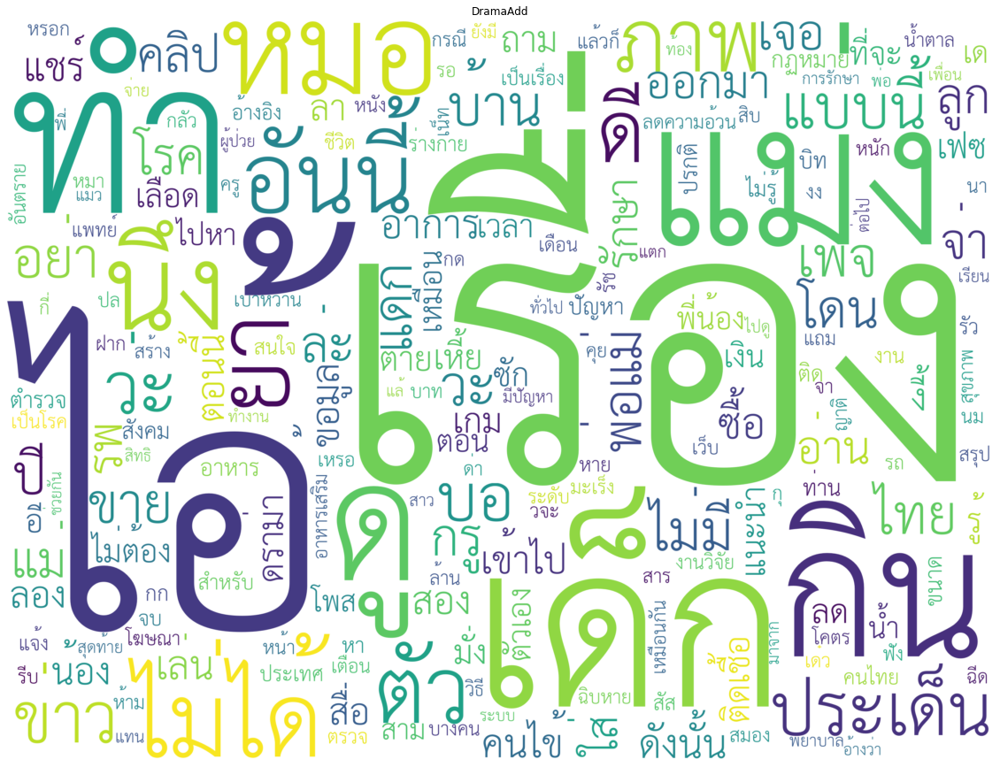

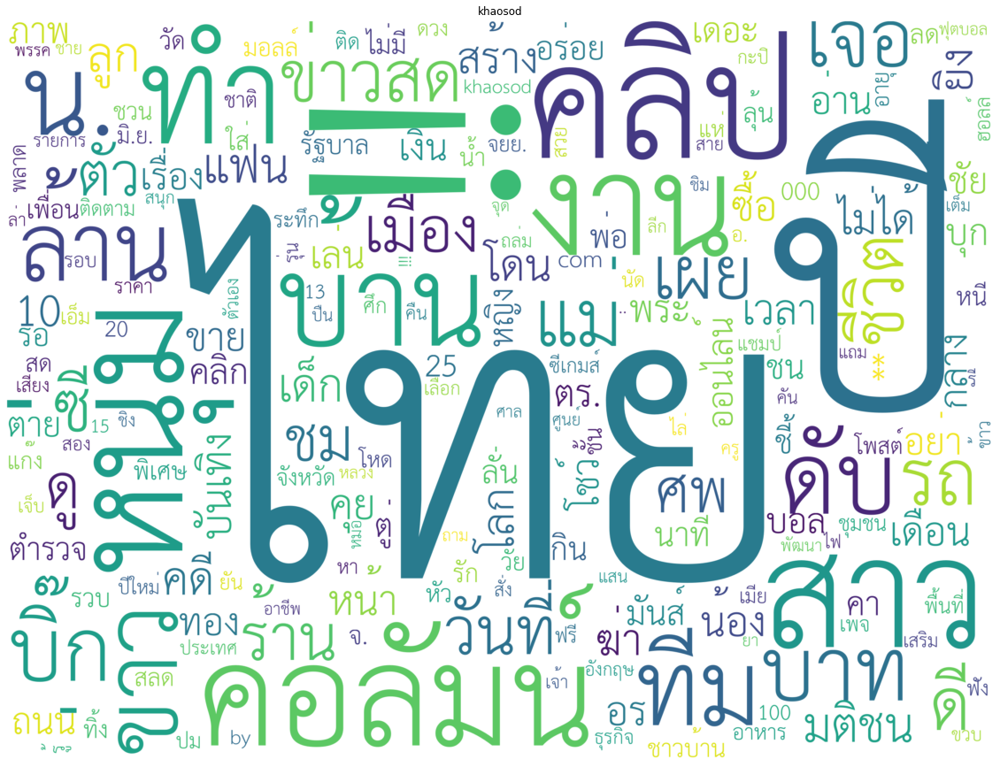

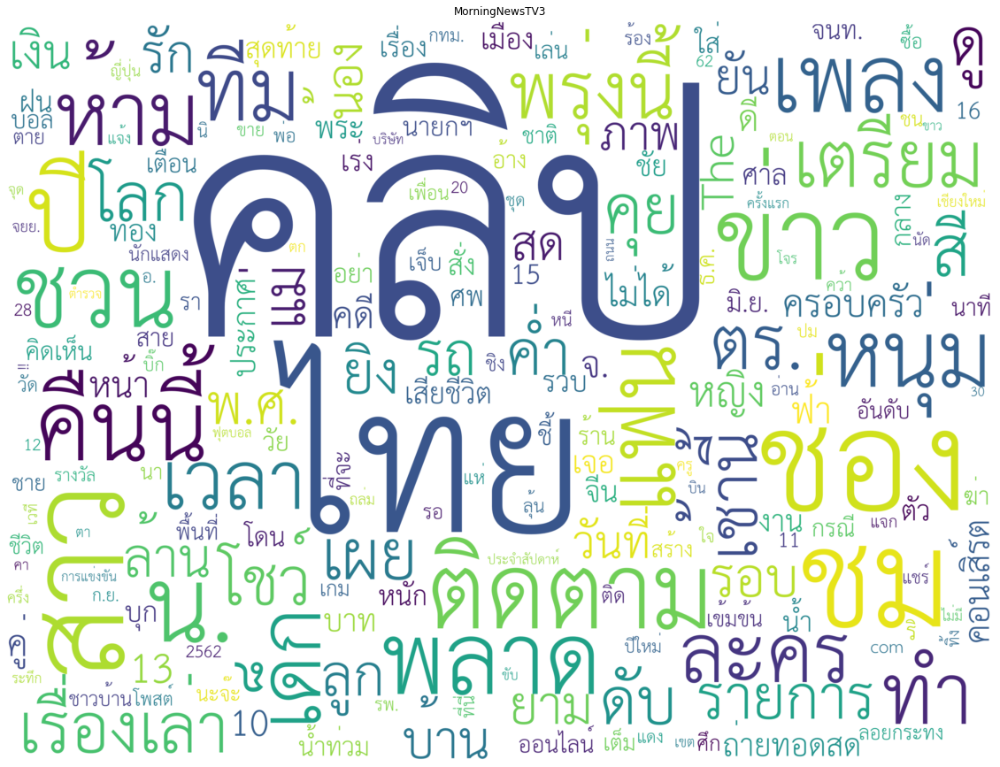

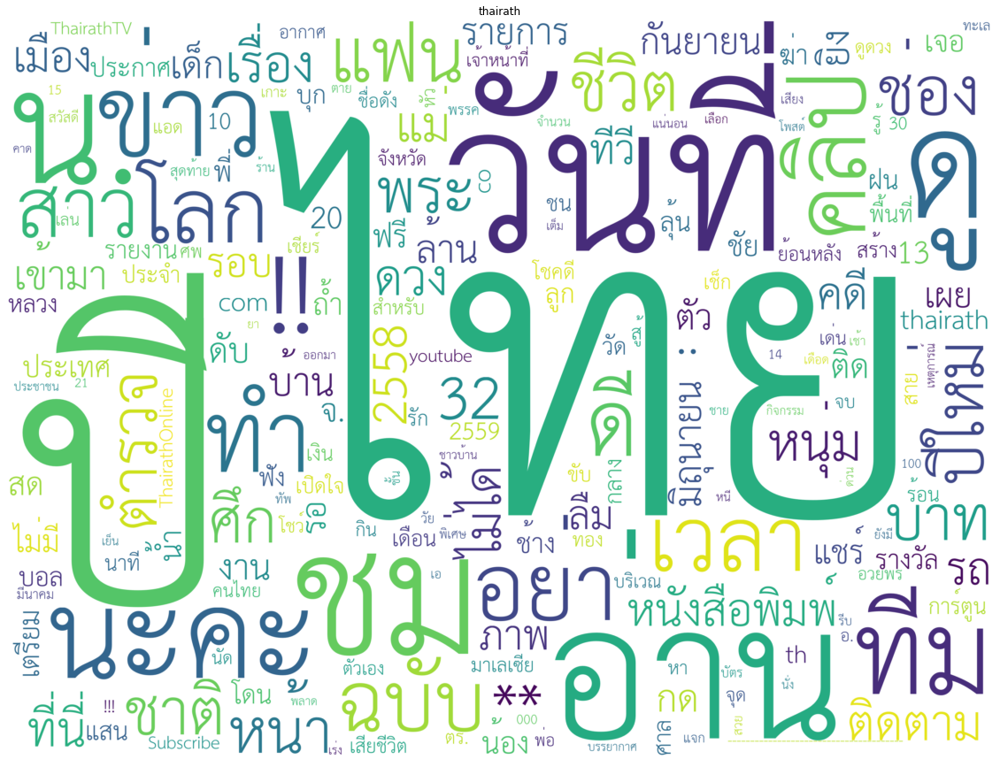

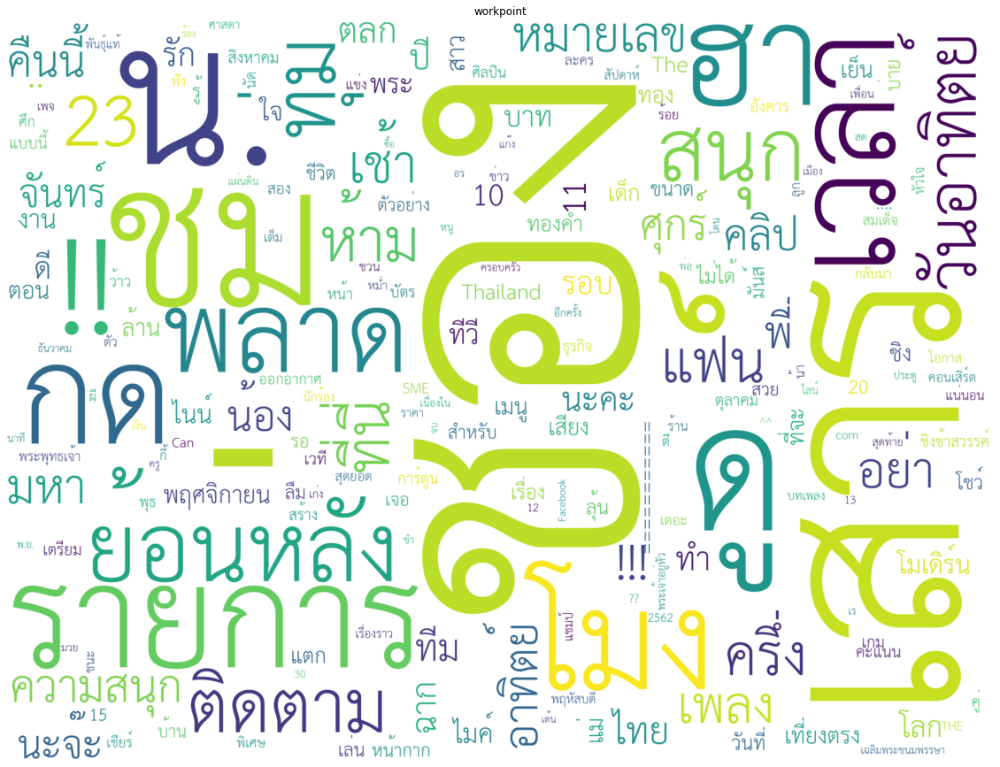

In [45]:
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

for p in df_post['page_name'].unique():
    tmp=df_post[df_post['page_name']==p].copy()
    sentences= tmp['post_message_token'].str.split().tolist()

    tokens_list_j = [','.join(tkn) for tkn in sentences]
    cvec = CountVectorizer(analyzer=lambda x:x.split(','))
    c_feat = cvec.fit_transform(tokens_list_j)
    word_count=c_feat.toarray().sum(axis=0)
    word_list=cvec.get_feature_names()
    d = {}
    for word,count in zip(word_list,word_count):
        d[word]=count

    wordcloud = WordCloud(font_path='THSarabunNew.otf',
                          relative_scaling = 1.0,
                          min_font_size=4,
                          background_color="white",
                          width=1024,
                          height=768,
                          scale=3,
                          font_step=1,
                          collocations=False,
                          margin=2
                          )
    wordcloud.generate_from_frequencies(frequencies=d)
    plt.figure(figsize=(20,20))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(p)
    # plt.show()
    plt.savefig('{}.png'.format(p))

In [16]:
len(cvec.get_feature_names())

25334

In [51]:
from yellowbrick.text import FreqDistVisualizer
vectorizer = CountVectorizer()
docs       = c_feat
features   = cvec.get_feature_names()

# visualizer = FreqDistVisualizer(features=features, orient='v',n=50)
# visualizer.fit(docs)
# visualizer.show()

CountVectorizer(analyzer=<function <lambda> at 0x0000023D821FDA60>,
                binary=False, decode_error='strict',
                dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=1,
                ngram_range=(1, 1), preprocessor=None, stop_words=None,
                strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, vocabulary=None)

In [ ]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(neg_text)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer
tvec = TfidfVectorizer(analyzer=lambda x:x.split(','),)
t_feat = tvec.fit_transform(tokens_list_j)

# # print idf values
# df_idf = pd.DataFrame(t_feat.idf_, index=t_feat.get_feature_names(),columns=["idf_weights"])
 
# # sort ascending
# df_idf.sort_values(by=['idf_weights'])

In [12]:
from wordcloud import STOPWORDS

wc_stop_words = ["คน", "น้อง", "ปี"] + list(STOPWORDS)+[]


def gen_wc(word_count,word_list,is_save=False,save_name='img.png'):
    d = {}
    for word,count in zip(word_list,word_count):
        d[word]=count

    wordcloud = WordCloud(font_path='THSarabunNew.otf',
                          relative_scaling = 1.0,
                          min_font_size=4,
                          background_color="white",
                          width=1024,
                          height=768,
                          scale=3,
                          font_step=1,
                          collocations=False,
                          margin=2,stopwords=wc_stop_words
                          )
    wordcloud.generate_from_frequencies(frequencies=d)
    plt.figure(figsize=(20,20))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    if is_save:
        plt.savefig(save_name)
    plt.show()


In [20]:
#all
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
sentences= df_post['post_message_token'].str.split().tolist()
tokens_list_j = [','.join(tkn) for tkn in sentences]
cvec = CountVectorizer(analyzer=lambda x:x.split(','),stop_words=thai_stopwords)
c_feat = cvec.fit_transform(tokens_list_j)
word_count=c_feat.toarray().sum(axis=0)

        
import scipy
# Multiply the resulting sparse matrix by the weight (count) of each sentence.
# like_weights=df_post['post_like_count'].tolist()
word_list=cvec.get_feature_names()

def gen_react_wc(df_post,col,is_save=False,save_name='save.png'):
    sentences= df_post['post_message_token'].str.split().tolist()
    tokens_list_j = [','.join(tkn) for tkn in sentences]
    cvec = CountVectorizer(analyzer=lambda x:x.split(','),stop_words=thai_stopwords)
    c_feat = cvec.fit_transform(tokens_list_j)
    
    like_weights=df_post[col].tolist()
    counts = scipy.sparse.diags(like_weights, 0)
    c_likes = (c_feat.T*counts).T
    word_like_count=c_likes.toarray().sum(axis=0)
    word_list=cvec.get_feature_names()
    gen_wc(word_like_count,word_list,is_save,save_name)
# c_likes = (c_likes.T * c_likes) # create co-occ

def gen_like_wc(df_post,col):
    like_weights=df_post[col].tolist()
    counts = scipy.sparse.diags(like_weights, 0)
    c_likes = (c_feat.T*counts).T
    word_like_count=c_likes.toarray().sum(axis=0)
    return word_like_count

In [14]:
value_dict={}
for col in ['post_like_count','post_angry_count','post_love_count','post_sad_count','post_wow_count','post_haha_count']:
    value_dict[col]=gen_like_wc(df_post,col).tolist()

In [15]:
word_list=cvec.get_feature_names()
value_dict['word']=word_list
df_tmp =pd.DataFrame(value_dict)
df_tmp['total'] =df_tmp[['post_like_count','post_angry_count','post_love_count','post_sad_count','post_wow_count','post_haha_count']].sum(axis=1)
df_tmp['page'] ='thai_rath'
# df_tmp.to_csv('word_thairath.csv')
pd.melt(df_tmp, id_vars=['word'], value_vars=['post_like_count','post_angry_count','post_love_count','post_sad_count','post_wow_count','post_haha_count']).to_csv('word_thairath.csv')

In [16]:
pages=df_post.page_name.unique().tolist()

In [57]:
df_plot=df_post[df_post['page_name']=='DramaAdd']

In [60]:
page='DramaAdd'


'DramaAdd_post_wow_count.png'

In [68]:
df_post['post_time'].sort_values()


2230    2009-09-15 13:45:31
2229    2009-09-16 07:16:04
2228    2009-09-16 09:41:14
2227    2009-09-16 10:12:17
2226    2009-09-17 08:00:08
               ...         
4       2019-11-14 22:39:25
3       2019-11-14 22:42:21
2       2019-11-14 23:19:12
1       2019-11-14 23:27:08
0       2019-11-14 23:32:53
Name: post_time, Length: 12912, dtype: object

DramaAdd
DramaAdd_post_haha_count.png


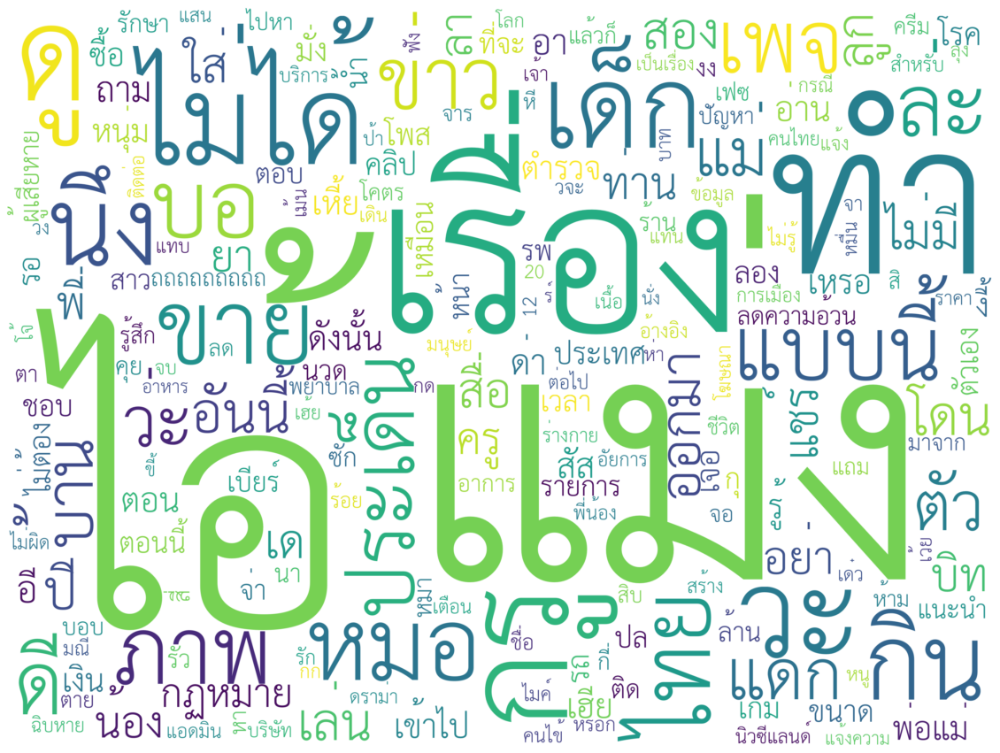

khaosod
khaosod_post_haha_count.png


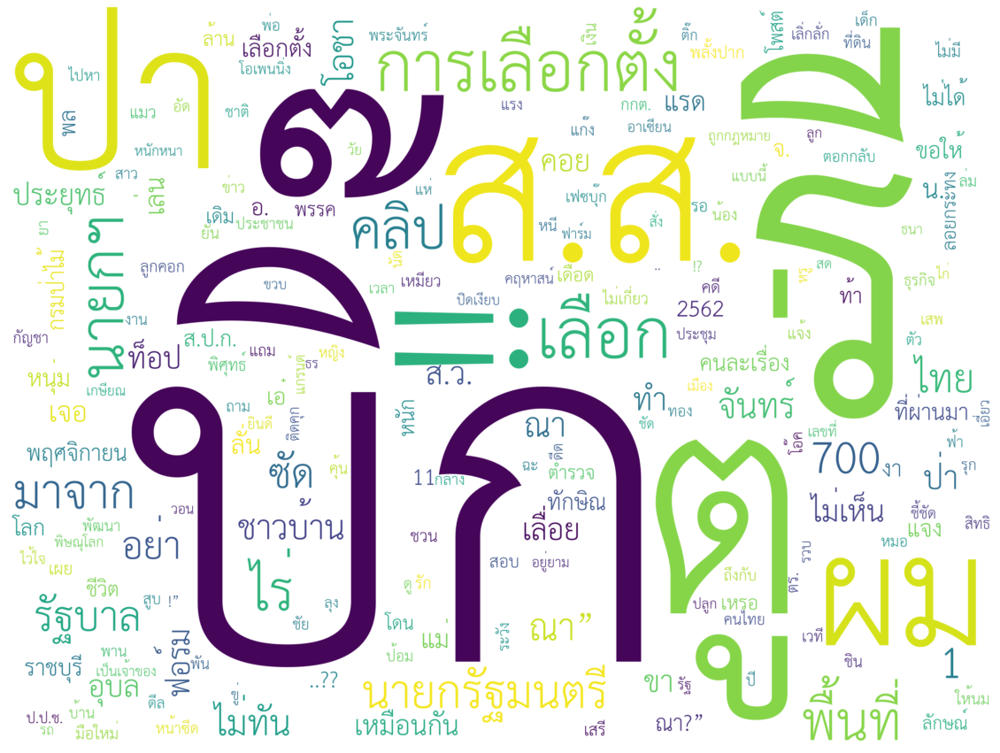

MorningNewsTV3
MorningNewsTV3_post_haha_count.png


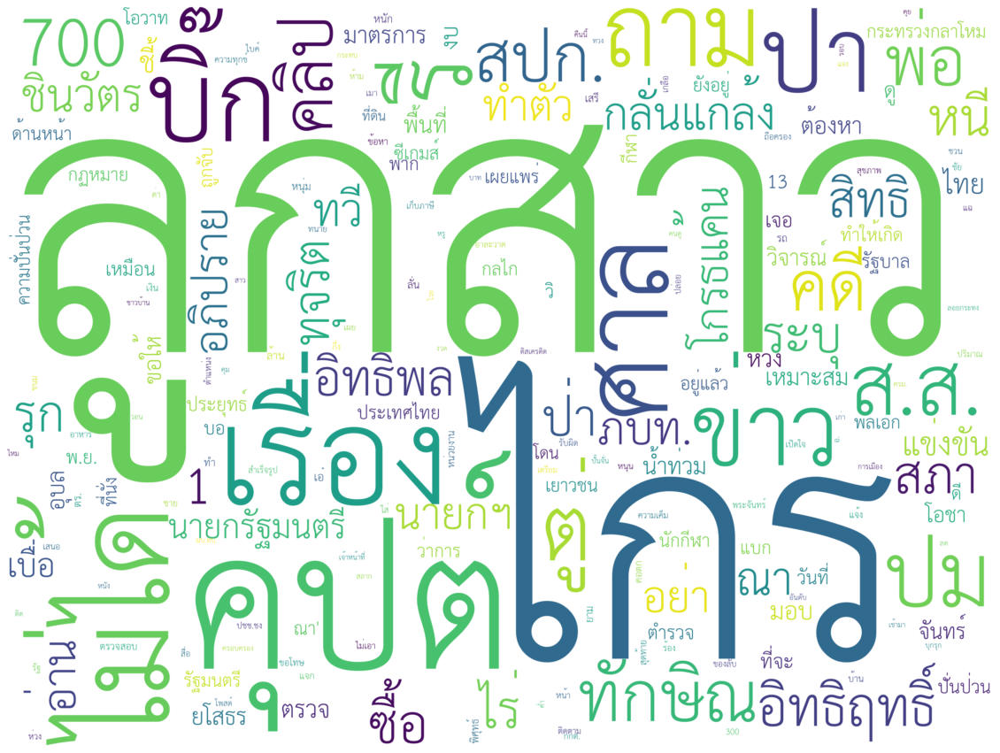

thairath
thairath_post_haha_count.png


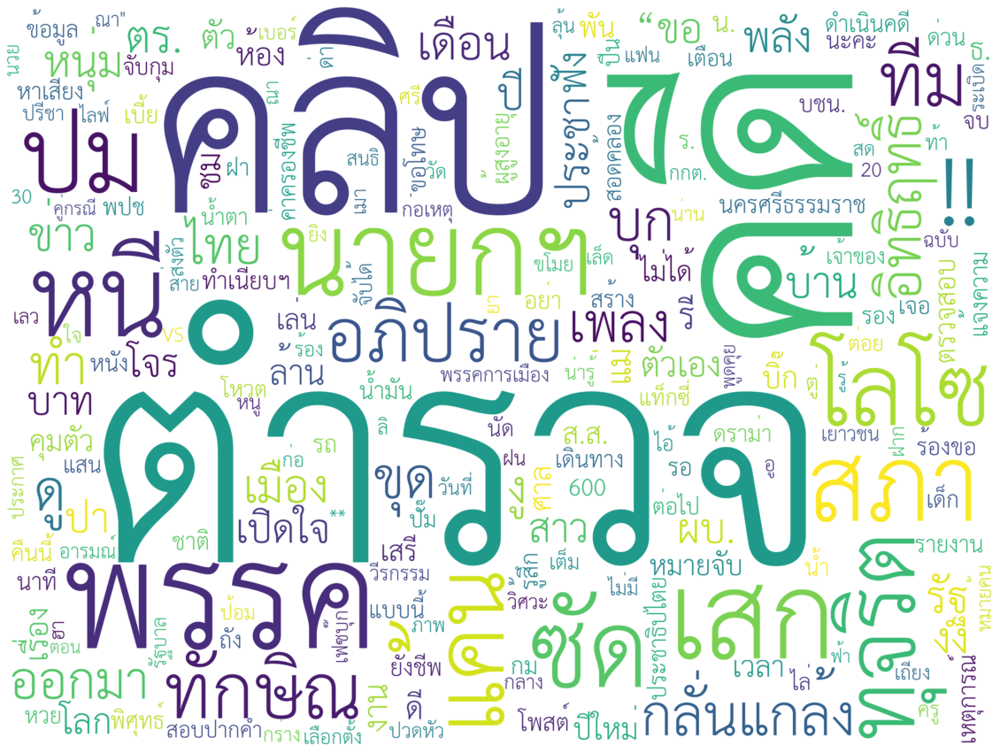

workpoint
workpoint_post_haha_count.png


In [ ]:
for page in pages:
    df_plot=df_post[df_post['page_name']==page]
    print(page)
    for col in ['post_haha_count']:
        save_name ='{}_{}.png'.format(page,col)
        print(save_name)
        gen_react_wc(df_plot,col,True,save_name)

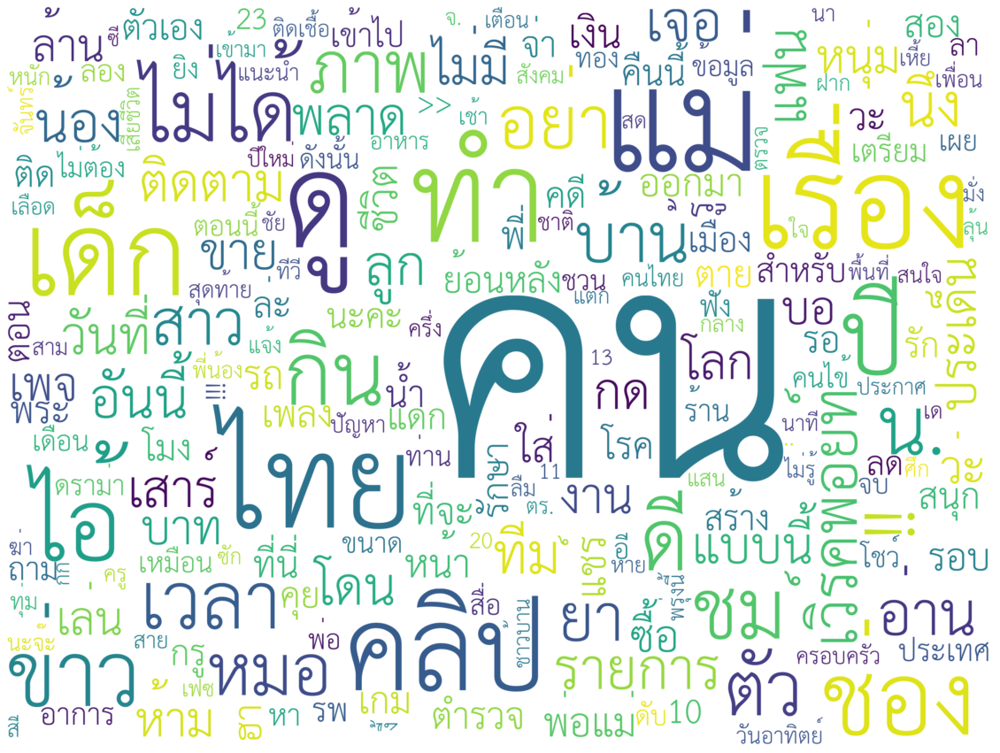

In [64]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

wordcloud = WordCloud(font_path='THSarabunNew.otf',
                      relative_scaling = 1.0,
                      min_font_size=4,
                      background_color="white",
                      width=1024,
                      height=768,
                      scale=3,
                      font_step=1,
                      collocations=False,
                      margin=2
                      )
wordcloud.generate_from_frequencies(frequencies=d)
plt.figure(figsize=(20,20))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
# plt.show()
plt.savefig('allpages.png')

In [42]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True)
tfidf_transformer.fit(c_feat)

TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)

In [44]:
# print idf values
df_idf = pd.DataFrame(tfidf_transformer.idf_, index=cvec.get_feature_names(),columns=["idf_weights"])
 
# sort ascending


,idf_weights
,6.109281
!!,3.990557
!!!,4.960658
!!!!,6.574170
!!!!!,8.268765
...,...
🚈🚈🚈,9.772843
🚉🎉,9.772843
🚶🚶,9.772843
🤦🏻‍♀️,9.772843


In [50]:
df_idf.sort_values('idf_weights')[:10]

,idf_weights
คน,3.032914
ดู,3.546306
ไทย,3.555239
คลิป,3.606375
ช่อง,3.634036
ทำ,3.661375
เรื่อง,3.743360
แม่,3.745770
ปี,3.776391
ชม,3.859340


In [71]:
df_post['page_name'].unique()
t_feat.shape

(12912, 25334)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

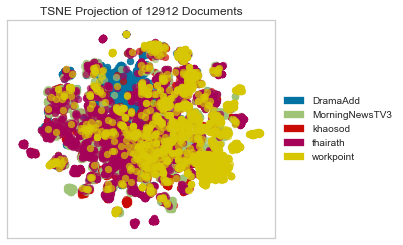

In [70]:
%%time
from sklearn.feature_extraction.text import TfidfVectorizer

from yellowbrick.text import TSNEVisualizer
from yellowbrick.datasets import load_hobbies

# Load the data and create document vectors
# corpus = load_hobbies()
# tfidf = TfidfVectorizer()

X = t_feat
y = df_post['page_name'].tolist()

# Create the visualizer and draw the vectors
tsne = TSNEVisualizer()
tsne.fit(X, y)


In [ ]:
X = t_feat
y = df_post['page_name'].tolist()

# Create the visualizer and draw the vectors
tsne = TSNEVisualizer()
fig,ax =plt.subplots(figsize=(15,10))
tsne.fit(X, y)

tsne.show('pageplot.png')

In [101]:
import matplotlib.pyplot as plt
# fig, ax =plt.subplots()
tsne_transform =tsne.transform(X)

# # plt.scatter(data2D[:,0], data2D[:,1], c=data.target)
# # plt.show()  

tsne.show()


### EXAMPLE

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

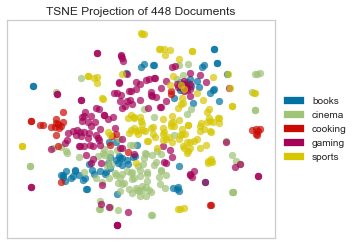

In [156]:
from sklearn.feature_extraction.text import TfidfVectorizer

from yellowbrick.text import TSNEVisualizer
from yellowbrick.datasets import load_hobbies

# Load the data and create document vectors
corpus = load_hobbies()
tfidf = TfidfVectorizer()

X = tfidf.fit_transform(corpus.data)
y = corpus.target

# Create the visualizer and draw the vectors
tsne = TSNEVisualizer()


ax=tsne.fit(X, y)
tsne.show()

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

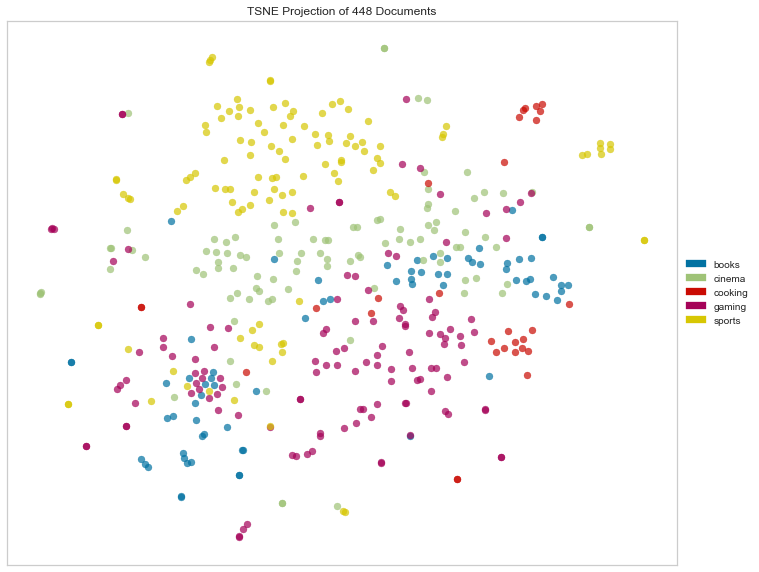

In [195]:
tsne = TSNEVisualizer()
import matplotlib.pyplot as plt
fig,ax =plt.subplots(figsize=(15,10))
tsne.fit(X, y)
tsne.show('poof.png')


In [171]:
# POST

df_post_interact =pd.read_csv('crawl_data/post interaction/thairath_post_interact.csv')
df_post_interact.head()

,Unnamed: 0,post_url,react_url,type,user_url,usr_name,crawl_timestamp
0,0,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/profile.php?id=100043772795365,เตย แล้วไง,2019-11-16 10:27:30.369146
1,1,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/kanaput.pituksakilcuy,Kanaput Pituksakilcuy,2019-11-16 10:27:30.369146
2,2,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/jzbs.sha,Jzbs Sha,2019-11-16 10:27:30.369146
3,3,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/nantiporn.chalee,Nantiporn Chalee,2019-11-16 10:27:30.369146
4,4,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/peek.phachariya,Peek Phachariya,2019-11-16 10:27:30.369146


In [188]:
df_usr_sum=df_post_interact.groupby(['user_url'])['post_url'].count()

n=200
top_n_usr=df_usr_sum.sort_values(ascending=False)[:n].index.tolist()

df_post_interact[df_post_interact['user_url'].isin(top_n_usr)]



,Unnamed: 0,post_url,react_url,type,user_url,usr_name,crawl_timestamp
42,42,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/profile.php?id=100009092715314,Yothin Wongpithak,2019-11-16 10:27:30.369146
76,76,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Haha,/profile.php?id=100023725447664,Sutanit Nacket,2019-11-16 10:27:31.174801
103,103,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/kamoltip.lengpanich.52,Lengpanich Nancy,2019-11-16 10:27:45.881031
104,104,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/manee.phaivong,Manee Phaivong,2019-11-16 10:27:45.881031
105,105,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/profile.php?id=100042455450964,บูรพา ไม่แพ้,2019-11-16 10:27:45.881031
...,...,...,...,...,...,...,...
239797,239797,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/profile.php?id=100003551409494,Job New Sty,2019-11-16 11:22:48.678906
239798,239798,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/omosoldier,สุรศักดิ์ วุฒิยา,2019-11-16 11:22:48.678906
239806,239806,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/kritipol.klaikeo,Kritipol Klaikeow,2019-11-16 11:22:48.678906
239848,239848,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Like,/may.athit,May Arthit,2019-11-16 11:22:48.678906


# User interaction

In [2]:
import pandas as pd
df_post_full  =pd.read_csv(r'C:\Users\Tanawat Chiewhawn\PycharmProjects\sna_project\crawl_data\thairath.csv')
df_post_full
df_post_full.columns

Index(['Unnamed: 0', 'post_page_id', 'post_id', 'post_time', 'post_link',
       'post_message', 'post_like_count', 'post_share_count',
       'post_reactor_count', 'post_comment_count', 'post_angry_count',
       'post_love_count', 'post_sad_count', 'post_wow_count',
       'post_haha_count', 'post_crawl_time', 'page_name'],
      dtype='object')

In [3]:
df_tmp=df_post_full[['post_id','post_time', 'post_link',
       'post_message', 'post_like_count', 'post_share_count',
       'post_reactor_count', 'post_comment_count', 'post_angry_count',
       'post_love_count', 'post_sad_count', 'post_wow_count',
       'post_haha_count', 'post_crawl_time', 'page_name']].copy()

In [4]:
import pandas as pd

df_post =pd.read_csv(r'C:\Users\Tanawat Chiewhawn\PycharmProjects\sna_project\crawl_data\post interaction\thairath_post_interact.csv')
df_post.head()

,Unnamed: 0,post_url,react_url,type,user_url,usr_name,crawl_timestamp
0,0,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/profile.php?id=100043772795365,เตย แล้วไง,2019-11-16 10:27:30.369146
1,1,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/kanaput.pituksakilcuy,Kanaput Pituksakilcuy,2019-11-16 10:27:30.369146
2,2,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/jzbs.sha,Jzbs Sha,2019-11-16 10:27:30.369146
3,3,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/nantiporn.chalee,Nantiporn Chalee,2019-11-16 10:27:30.369146
4,4,https://www.facebook.com/thairath/posts/101586...,/ufi/reaction/profile/browser/fetch/?limit=400...,Wow,/peek.phachariya,Peek Phachariya,2019-11-16 10:27:30.369146


In [5]:
df_merge=pd.merge(df_post, df_tmp,left_on='post_url',right_on='post_link').reset_index(drop=True)

In [6]:
users =df_merge[['user_url','usr_name']].drop_duplicates().reset_index(drop=True)
posts=df_merge[['post_id','post_time', 'post_link',
       'post_message', 'post_like_count', 'post_share_count',
       'post_reactor_count', 'post_comment_count', 'post_angry_count',
       'post_love_count', 'post_sad_count', 'post_wow_count',
       'post_haha_count', 'post_crawl_time', 'page_name']].drop_duplicates().reset_index(drop=True)

print('total interaction',len(df_merge))
print('total user',len(users))
print('total post',len(posts))

total interaction 240015
total user 107549
total post 219


## User interaction analysis

In [7]:
df_user_summary=df_merge.groupby(['user_url','usr_name','type'])['post_url'].count().reset_index()
df_user_summary=pd.pivot_table(df_user_summary, values='post_url', index=['user_url', 'usr_name'],
                    columns='type', aggfunc='sum', fill_value=0).reset_index()
df_user_summary['total']=df_user_summary[['Angry','Haha','Like','Love','Sad','Wow']].sum(axis=1)
df_user_summary['total_nolike']=df_user_summary[['Angry','Haha','Love','Sad','Wow']].sum(axis=1)

In [8]:
df_user_summary.nlargest(10,'total_nolike')

type,user_url,usr_name,Angry,Haha,Like,Love,Sad,Wow,total,total_nolike
106170,/wongchai.seangram,Wongchai Seangram,3,35,18,4,10,27,97,79
71737,/profile.php?id=100023725447664,Sutanit Nacket,2,43,29,0,7,24,105,76
74575,/profile.php?id=100025444880233,อำนวย ริบวงษ์สุด,0,2,0,3,13,48,66,66
78192,/profile.php?id=100028006698460,สมศักดิ์ เทพวิเชียร,0,21,3,0,10,11,45,42
77128,/profile.php?id=100027251690932,ทำดี เท่าที่ทำ,2,6,6,0,17,11,42,36
107318,/yuttapum.kaewkong.3,Yuttapum Kaewkong,3,16,15,2,10,5,51,36
65238,/profile.php?id=100015601411398,ตั้งจัยแต่ยังไป่บ่ถึง หมอนพังเทียง,0,2,0,0,8,23,33,33
89658,/profile.php?id=100042542627646,ชีวิตดี๊ดี ชีวิตดี๊ดี,10,2,7,6,6,9,40,33
106108,/witthawat.prachamdee.5,Witthawat Prachamdee,4,4,18,0,10,14,50,32
27644,/onnnum,อ้น ก้นป่อง,14,13,31,1,0,1,60,29


In [10]:
tmp_plot={'i':[],
         'at':[],
         'atleast':[]}
for a in range(209):
    print('total user with {} interaction: {}/{}'.format(a,len(df_user_summary[df_user_summary['total']==a]),len(df_user_summary[df_user_summary['total']>=a])))
    tmp_plot['i'].append(a)
    tmp_plot['at'].append(len(df_user_summary[df_user_summary['total']==a]))
    tmp_plot['atleast'].append(len(df_user_summary[df_user_summary['total']>=a]))

total user with 0 interaction: 0/107549
total user with 1 interaction: 71463/107549
total user with 2 interaction: 15640/36086
total user with 3 interaction: 7026/20446
total user with 4 interaction: 3793/13420
total user with 5 interaction: 2313/9627
total user with 6 interaction: 1536/7314
total user with 7 interaction: 1131/5778
total user with 8 interaction: 856/4647
total user with 9 interaction: 615/3791
total user with 10 interaction: 486/3176
total user with 11 interaction: 405/2690
total user with 12 interaction: 307/2285
total user with 13 interaction: 238/1978
total user with 14 interaction: 206/1740
total user with 15 interaction: 185/1534
total user with 16 interaction: 140/1349
total user with 17 interaction: 109/1209
total user with 18 interaction: 109/1100
total user with 19 interaction: 90/991
total user with 20 interaction: 75/901
total user with 21 interaction: 78/826
total user with 22 interaction: 70/748
total user with 23 interaction: 59/678
total user with 24 int

In [11]:
df_plot=pd.DataFrame(tmp_plot)
df_plot[:100].plot(x='i',y='at',kind='bar',logy =True,figsize=(20,10))

In [155]:
len(df_user_summary[df_user_summary['total']>1])

36086

## Setup networks

In [13]:
df_tmp =df_user_summary.nlargest(10,'total')
df_tmp =df_user_summary.nlargest(100,'total_nolike')

df_connections=pd.merge(df_merge, df_tmp,left_on='user_url',right_on='user_url')


edge_dict={}

for t in df_connections['type'].unique():
    edges=[]
    df_tmp_edges =df_connections[df_connections['type']==t]
    for a,b in zip(df_tmp_edges['post_id'],df_tmp_edges['user_url']):
        edges.append((a,b))
    edge_dict[t]=edges
for k,v in edge_dict.items():
    print(k,len(v))
df_tmp.head()

Wow 460
Sad 288
Love 123
Like 1105
Angry 337
Haha 763


type,user_url,usr_name,Angry,Haha,Like,Love,Sad,Wow,total,total_nolike
106170,/wongchai.seangram,Wongchai Seangram,3,35,18,4,10,27,97,79
71737,/profile.php?id=100023725447664,Sutanit Nacket,2,43,29,0,7,24,105,76
74575,/profile.php?id=100025444880233,อำนวย ริบวงษ์สุด,0,2,0,3,13,48,66,66
78192,/profile.php?id=100028006698460,สมศักดิ์ เทพวิเชียร,0,21,3,0,10,11,45,42
77128,/profile.php?id=100027251690932,ทำดี เท่าที่ทำ,2,6,6,0,17,11,42,36


## user networks

In [35]:
import networkx

#example
from pyvis.network import Network
net = Network(notebook=True,height="1000px", width="100%")


tmp=df_tmp.to_dict()
color="blue"
nodes_dict={}
n_nodes=len(tmp['usr_name'].keys())
node_list=list(i for i in tmp['user_url'].values())
nodes_dict['title']=list(i for i in tmp['usr_name'].values())
max_count=1#max(tmp['total'].values())
scale=1
nodes_dict['value']=list(int(i/max_count*scale) for i in tmp['total'].values())
# nodes_dict['title']=list('{} \n (like {}, share {})'.format(k,i,j) for k, i, j in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values()))
# nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
# nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
# nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
nodes_dict['label'] =list(tmp['usr_name'].values())
nodes_dict['color']=list(color for i in range(n_nodes))


net.add_nodes(node_list,**nodes_dict )

net.show('users.html')


## Post network

In [204]:
import networkx

#example
from pyvis.network import Network
net = Network(notebook=True,height="1000px", width="100%")


tmp=posts.to_dict()
color="#dd4b39"
nodes_dict={}
n_nodes=len(tmp['post_id'].keys())
node_list=list(i for i in tmp['post_id'].values())
max_count=1#max(tmp['post_reactor_count'].values())
scale=1
nodes_dict['value']=list(int(i/max_count*scale) for i in tmp['post_reactor_count'].values())
nodes_dict['title']=list('{} \n (like {}, share {})'.format(k,i,j) for k, i, j in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values()))
# nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
# nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
# nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
nodes_dict['label'] =list(tmp['post_id'].values())
nodes_dict['color']=list(color for i in range(n_nodes))

net.add_nodes(node_list,**nodes_dict )

net.show('posts.html')

## combine

In [15]:
import networkx

#example
from pyvis.network import Network
net = Network(notebook=True,height="1000px", width="100%")
net.force_atlas_2based()

is_fix= False
fix=5

tmp=df_tmp.to_dict()
color="blue"
nodes_dict={}
n_nodes=len(tmp['usr_name'].keys())
node_list=list(i for i in tmp['user_url'].values())
nodes_dict['title']=list(i for i in tmp['usr_name'].values())

if is_fix:
    nodes_dict['size']=list(fix for i in tmp['total'].values())
else:
    max_count=max(tmp['total'].values())
    scale=100
    nodes_dict['size']=list(int(i/max_count*scale) for i in tmp['total'].values())
# nodes_dict['title']=list('{} \n (like {}, share {})'.format(k,i,j) for k, i, j in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values()))
# nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
# nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
# nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
nodes_dict['label'] =list(tmp['usr_name'].values())
nodes_dict['color']=list(color for i in range(n_nodes))


net.add_nodes(node_list,**nodes_dict )

tmp=posts.to_dict()
color="#dd4b39"
nodes_dict={}
n_nodes=len(tmp['post_id'].keys())
node_list=list(i for i in tmp['post_id'].values())

if is_fix:
    nodes_dict['size']=list(fix for i in tmp['post_reactor_count'].values())
else:
    max_count=max(tmp['post_reactor_count'].values())
    scale=200
    nodes_dict['size']=list(int(i/max_count*scale) for i in tmp['post_reactor_count'].values())
nodes_dict['title']=list('{} \n (like {}, share {})'.format(k,i,j) for k, i, j in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values()))
# nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
# nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
# nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
nodes_dict['label'] =list(tmp['post_id'].values())
nodes_dict['color']=list(color for i in range(n_nodes))

net.add_nodes(node_list,**nodes_dict )
# edges=[('/niyomsaeiiw',10158667801912439)]
net.add_edges(edge_dict['Haha'])
# for n in net.nodes:
#     n.update({'physics': False})
    
net.show('tmp.html')



In [16]:
## interaction

import networkx
top_n =100
inter='Haha'
def gen_network_inter(top_n,inter,censor=True,col_top='total_nolike',post_size_col='post_reactor_count'):
    column_post='post_{}_count'.format(inter.lower())

    df_tmp =df_user_summary.nlargest(top_n,col_top)

    df_connections=pd.merge(df_merge, df_tmp,left_on='user_url',right_on='user_url')
    edge_dict={}

    for t in df_connections['type'].unique():
        edges=[]
        df_tmp_edges =df_connections[df_connections['type']==t]
        for a,b in zip(df_tmp_edges['post_id'],df_tmp_edges['user_url']):
            edges.append((a,b))
        edge_dict[t]=edges
    for k,v in edge_dict.items():
        print(k,len(v))
    df_tmp.head()


    from pyvis.network import Network
    net = Network(notebook=True,height="500px", width="50%")
    net.force_atlas_2based()

    is_fix= False
    fix=5
    # USERRR
    tmp=df_tmp.to_dict()
    color="blue"
    nodes_dict={}
    n_nodes=len(tmp['usr_name'].keys())
    node_list=list(i for i in tmp['user_url'].values())

    if is_fix:
        nodes_dict['size']=list(fix for i in tmp['total_nolike'].values())
    else:
        max_count=max(tmp['total_nolike'].values())
        scale=100
        nodes_dict['size']=list(int(i/max_count*scale) for i in tmp['total_nolike'].values())
    # nodes_dict['title']=list('{} \n (like {}, share {})'.format(k,i,j) for k, i, j in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values()))
    # nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
    # nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
    # nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
    if censor:
        nodes_dict['label'] =list(tmp['total_nolike'].values())
        nodes_dict['title']=list('{} [{}/{}] '.format(inter,j,k) for j,k in zip(tmp[inter].values(),tmp['total_nolike'].values()))

    else:
        nodes_dict['label'] =list(tmp['usr_name'].values())
        nodes_dict['title']=list('{} {} [{}/{}] '.format(i,inter,j,k) for i,j,k in zip( tmp['usr_name'].values(),tmp[inter].values(),tmp['total_nolike'].values()))

    nodes_dict['color']=list(color for i in range(n_nodes))


    net.add_nodes(node_list,**nodes_dict )


    # POISTT
    tmp=posts.to_dict()
    color="#dd4b39"
    nodes_dict={}
    n_nodes=len(tmp['post_id'].keys())
    node_list=list(i for i in tmp['post_id'].values())

    if is_fix:
        nodes_dict['size']=list(fix for i in tmp[post_size_col].values())
    else:
        max_count=max(tmp['post_reactor_count'].values())
        scale=100
        nodes_dict['size']=list(int(i/max_count*scale) for i in tmp[post_size_col].values())
    nodes_dict['title']=list('(like {}, share {}, {} [{}/{}]) <br> {}'.format(i,j,inter,h,l,k) for k, i, j,l,h in zip(tmp['post_message'].values(),tmp['post_like_count'].values(),tmp['post_share_count'].values(), tmp['post_reactor_count'].values(),tmp[column_post].values()))
    # nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
    # nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
    # nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
    nodes_dict['label']=list('(like {}, share {}, {} [{}/{}])'.format(i,j,inter,h,l) for i,j,l,h in zip(tmp['post_like_count'].values(),tmp['post_share_count'].values(), tmp['post_reactor_count'].values(),tmp[column_post].values()))

    nodes_dict['color']=list(color for i in range(n_nodes))

    net.add_nodes(node_list,**nodes_dict )
    net.add_edges(edge_dict[inter])

    print(inter)
    net.show_buttons(filter_=['physics'])
    net.show('top{}_{}_censor_{}.html'.format(top_n,inter,censor))

top_n =30
inter='Angry'
gen_network_inter(top_n,inter,col_top='Angry')


Like 248
Haha 85
Sad 33
Angry 272
Wow 36
Love 34
Angry


In [422]:
top_n =100
inter='Like'
gen_network_inter(top_n,inter,censor=True)

Wow 460
Sad 288
Love 123
Like 1105
Angry 337
Haha 763
Like


In [419]:
inter_list=['Wow', 'Sad', 'Love', 'Like', 'Angry', 'Haha']
top_n =150
for inter in inter_list:
    gen_network_inter(top_n,inter,False)

Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Wow
Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Sad
Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Love
Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Like
Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Angry
Wow 528
Sad 396
Love 172
Like 1440
Angry 449
Haha 998
Haha


C:\Users\Tanawat Chiewhawn\PycharmProjects\sna_ai\venv\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


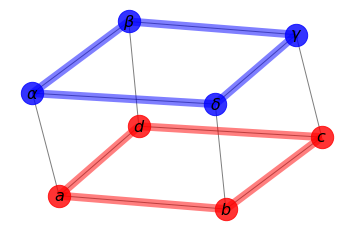

In [316]:
import matplotlib.pyplot as plt
import networkx as nx

G = nx.cubical_graph()
pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos,
                       nodelist=[0, 1, 2, 3],
                       node_color='r',
                       node_size=500,
                       alpha=0.8)
nx.draw_networkx_nodes(G, pos,
                       nodelist=[4, 5, 6, 7],
                       node_color='b',
                       node_size=500,
                       alpha=0.8)

# edges
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
nx.draw_networkx_edges(G, pos,
                       edgelist=[(0, 1), (1, 2), (2, 3), (3, 0)],
                       width=8, alpha=0.5, edge_color='r')
nx.draw_networkx_edges(G, pos,
                       edgelist=[(4, 5), (5, 6), (6, 7), (7, 4)],
                       width=8, alpha=0.5, edge_color='b')


# some math labels
labels = {}
labels[0] = r'$a$'
labels[1] = r'$b$'
labels[2] = r'$c$'
labels[3] = r'$d$'
labels[4] = r'$\alpha$'
labels[5] = r'$\beta$'
labels[6] = r'$\gamma$'
labels[7] = r'$\delta$'
nx.draw_networkx_labels(G, pos, labels, font_size=16)

plt.axis('off')
plt.show()

import networkx as nx

G = nx.Graph()
G.add_edge(1,2,color='r',weight=2)
G.add_edge(2,3,color='b',weight=4)
G.add_edge(3,4,color='g',weight=6)

pos = nx.circular_layout(G)

edges = G.edges()
colors = [G[u][v]['color'] for u,v in edges]
weights = [G[u][v]['weight'] for u,v in edges]

nx.draw(G, pos, edges=edges, edge_color=colors, width=weights)

In [468]:
np.array((10,10))

array([10, 10])

In [505]:
len(posts)

219

In [503]:
posts['post_time'].max()

'2019-11-14 23:32:53'

In [502]:
posts['post_time'].min()

'2019-11-14 00:59:10'

circular_layout
random_layout
shell_layout
spring_layout
spectral_layout

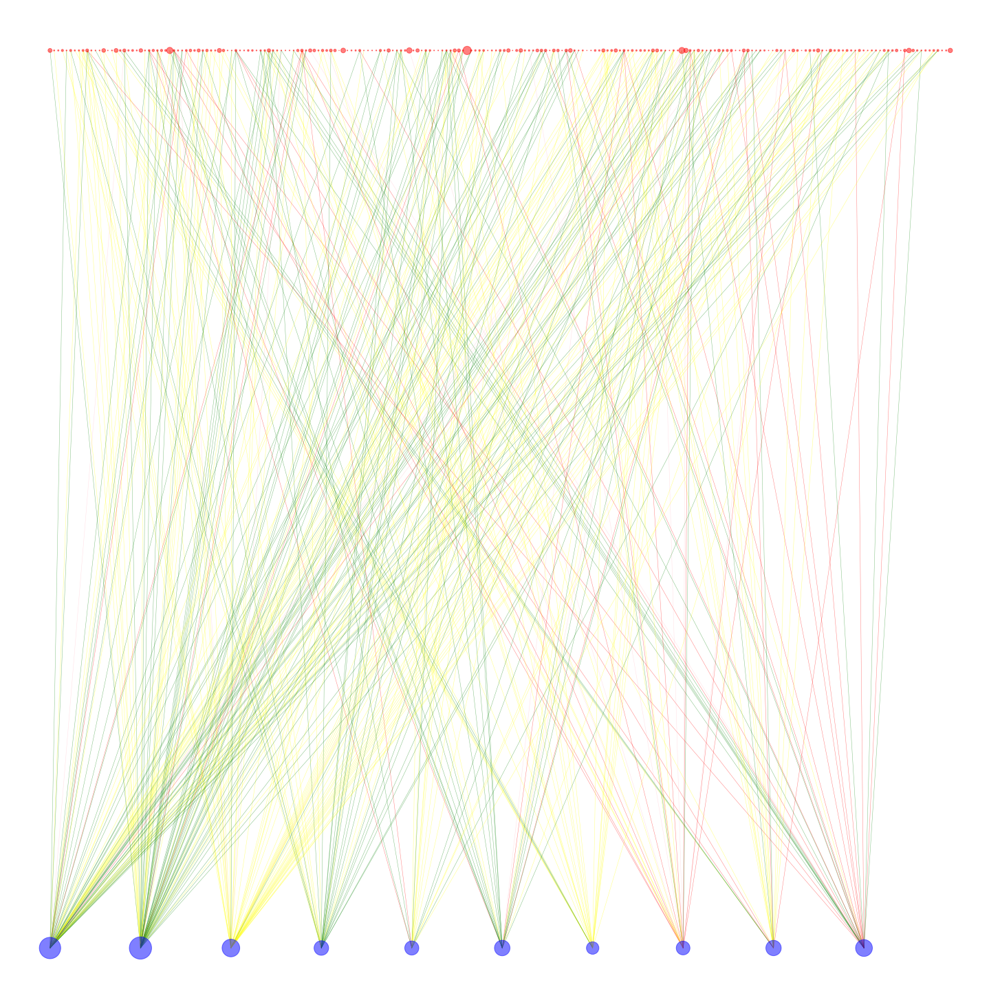

In [497]:
import networkx as nx
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,20)
top_n=10
col_top='total_nolike'
df_tmp =df_user_summary.nlargest(top_n,col_top)

df_connections=pd.merge(df_merge, df_tmp,left_on='user_url',right_on='user_url')
edge_dict={}
for t in df_connections['type'].unique():
    edges=[]
    df_tmp_edges =df_connections[df_connections['type']==t]
    for a,b in zip(df_tmp_edges['post_id'],df_tmp_edges['user_url']):
        edges.append((a,b))
    edge_dict[t]=edges
    
    
tmp_post=posts.to_dict()
tmp_user=df_tmp.to_dict()

G = nx.Graph()
pos_list={}
x_len =200

#POST
node_list=list(i for i in tmp_post['post_id'].values())
post_z =x_len/len(node_list)
node_size =list((i/100) for i in tmp_post['post_like_count'].values())
node_color =list('red' for i in tmp_post['post_id'].values())
for i, n in enumerate(node_list):
    pos_list[n] = np.array((i*post_z,5))
# for a in node_list:
#     G.add_node(int(a),color='red',title='post')

# Users

usr_x=x_len/len(tmp_user['user_url'].values())

node_list+=list(i for i in tmp_user['user_url'].values())
node_size +=list(i*10 for i in tmp_user['total'].values())
node_color +=list('blue' for i in tmp_user['user_url'].values())
for i, n in enumerate(tmp_user['user_url'].values()):
    pos_list[n] = np.array((i*usr_x,0))

G.add_nodes_from(node_list)
# G.add_edge(10158670077292439, '/profile.php?id=100023725447664')
# G.add_edges_from(edge_dict['Like'],color='green')
G.add_edges_from(edge_dict['Love'],color='pink')
G.add_edges_from(edge_dict['Haha'],color='green')
G.add_edges_from(edge_dict['Wow'],color='yellow')
G.add_edges_from(edge_dict['Angry'],color='Red')
edge_color = [G[u][v]['color'] for u,v in G.edges]

pos=pos_list

# pos=nx.circular_layout(G)
# pos=nx.random_layout(G)
# pos=nx.shell_layout(G)
# pos=nx.spring_layout(G,k=None, pos=None, fixed=None, iterations=50, weight='weight', scale=1, center=None, dim=2)
# pos=nx.spectral_layout(G)

nx.draw(G,pos=pos,
        node_size =node_size,
        node_color=node_color,
        edge_color=edge_color,
        width=0.5,
        with_labels=False,
        font_weight='bold',
        alpha=0.5)

plt.show()

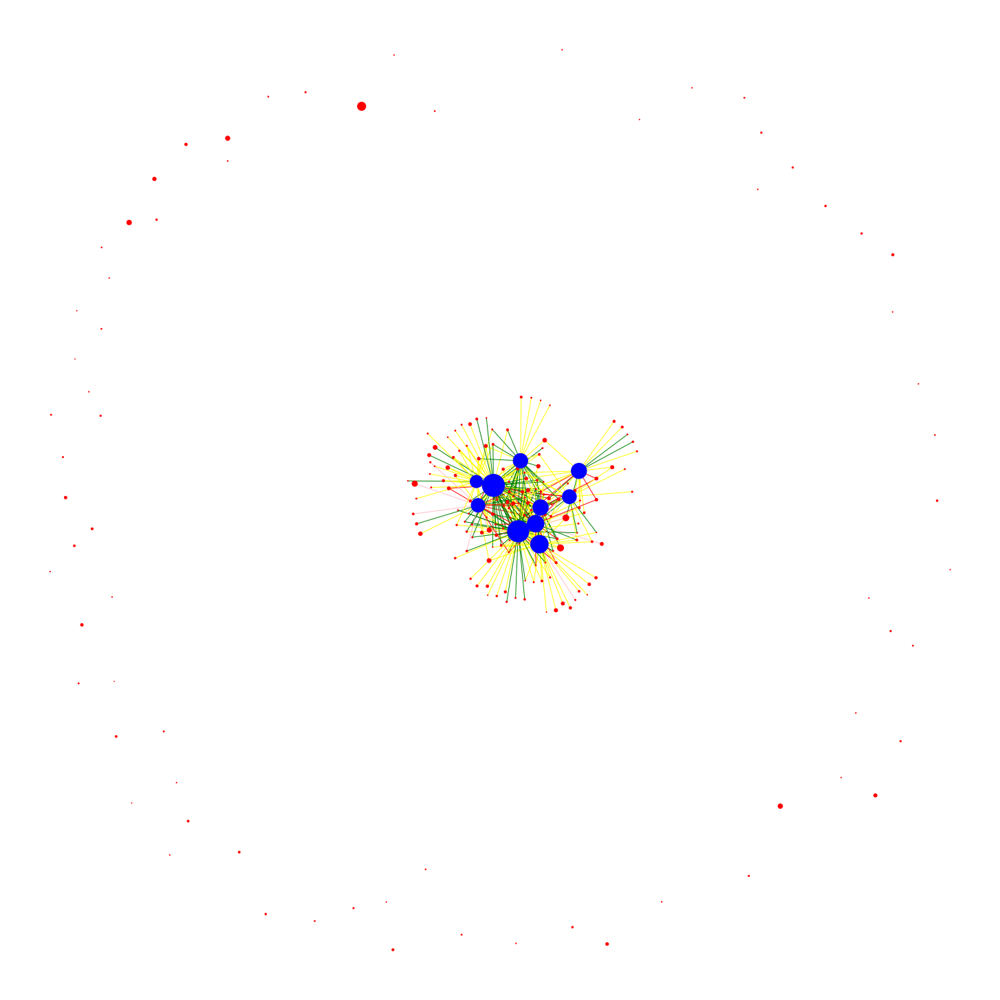

In [498]:
pos=nx.spring_layout(G,k=0.1, pos=None, fixed=None, iterations=50, weight='weight', scale=2, center=None, dim=2)
# pos=nx.spectral_layout(G)

nx.draw(G,pos=pos, node_size =node_size,node_color=node_color,edge_color=edge_color,width=1,with_labels=False, font_weight='bold')

plt.show()

In [361]:
from pyvis.network import Network


Gvis = Network()
Gvis.from_nx(G)
Gvis.barnes_hut()
Gvis.show_buttons(filter_=['physics','nodes'])
Gvis.show('tmp.html')

In [97]:
users.head()

,user_url,usr_name
0,/profile.php?id=100043772795365,เตย แล้วไง
1,/kanaput.pituksakilcuy,Kanaput Pituksakilcuy
2,/jzbs.sha,Jzbs Sha
3,/nantiporn.chalee,Nantiporn Chalee
4,/peek.phachariya,Peek Phachariya


In [ ]:
# edge_list =[(0,10),(0,62)]
edge_list=[]
# gen network
pfm_list,pfm_dict =gen_nodes_dict(df_nodes[df_nodes['Type']=='pfm'].to_dict(),size=5,color='blue')
future_node_list,future_nodes_dict  =gen_nodes_dict(df_nodes[df_nodes['Type']=='future'].to_dict(),color='green',size=5)
cpp_nodes, cpp_dict =gen_nodes_dict(df_nodes[df_nodes['Platform']=='APP'].to_dict(),color='red',size=6)
node_list,node_dict =gen_nodes_dict(df_nodes[df_nodes['Type'].isin(['start_node','end_node'])].to_dict(),size=1,color='black')

net = Network(notebook=True,height="500px", width="175%")


net.add_nodes(node_list,**node_dict )
net.add_nodes(pfm_list,**pfm_dict)
net.add_nodes(future_node_list,**future_nodes_dict)
net.add_nodes(cpp_nodes, **cpp_dict)

net.add_edges(edge_list_existing)
net.add_edges(edge_list)
for n in net.nodes:
    n.update({'physics': False})
# net.enable_physics(False)
net.toggle_drag_nodes(False)
net.show('test.html')

In [ ]:
def scale_x(z=10,target=0,x_pfm=888525.008):
    return target-x_pfm/z
def scale_y(z=10,target=0,y_pfm=914700.00):
    return target-y_pfm/z

def xadj(x,z=100):
    return x/z+scale_x(z)

def yadj(y,z=100):
    return y/z+scale_y(z)

def gen_nodes_dict(pfm_dict,color="#dd4b39",size=500,value=100):
    nodes_dict={}
    n_nodes=len(pfm_dict['Platform'].keys())
    node_list=list(i for i in pfm_dict['id'].values())
    nodes_dict['size']=list(size for i in range(n_nodes))
#     nodes_dict['value']=list(value for i in range(n_nodes))
    nodes_dict['title']=list('{} ({},{})'.format(k,i,j) for k, i, j in zip(pfm_dict['Type'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
    nodes_dict['x']=list(xadj(v) for v in pfm_dict['X'].values())
    nodes_dict['y']=list(yadj(v) for v in pfm_dict['Y'].values())
    # nodes_dict['label']=list('{} ({},{})'.format(i,j,k) for i, j , k in zip(pfm_dict['Platform'].values(),pfm_dict['X'].values(),pfm_dict['Y'].values()))
    nodes_dict['label'] =list(pfm_dict['Platform'].values())
    nodes_dict['color']=list(color for i in range(n_nodes))
    # nodes_dict['physics']=list(False for i in range(n_nodes))
    return node_list,nodes_dict

def add_node_from_dict(network):
    pass
    